<a href="https://colab.research.google.com/github/AI-Champ/Temperature_prediction/blob/main/temperature_Prediction_ARIMA_SARIMA_AutoARIMA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data loading.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

train=pd.read_csv('/content/drive/MyDrive/All_Datasets/Time_series/Weather_forecasting/DailyDelhiClimateTrain.csv')
test=pd.read_csv('/content/drive/MyDrive/All_Datasets/Time_series/Weather_forecasting/DailyDelhiClimateTest.csv')

In [ ]:
train.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.00,84.50,0.00,1015.67
1,2013-01-02,7.40,92.00,2.98,1017.80
2,2013-01-03,7.17,87.00,4.63,1018.67
3,2013-01-04,8.67,71.33,1.23,1017.17
4,2013-01-05,6.00,86.83,3.70,1016.50


In [ ]:
train.tail()

,date,meantemp,humidity,wind_speed,meanpressure
1457,2016-12-28,17.22,68.04,3.55,1015.57
1458,2016-12-29,15.24,87.86,6.00,1016.90
1459,2016-12-30,14.10,89.67,6.27,1017.90
1460,2016-12-31,15.05,87.00,7.33,1016.10
1461,2017-01-01,10.00,100.00,0.00,1016.00


In [ ]:
test.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2017-01-01,15.91,85.87,2.74,59.00
1,2017-01-02,18.50,77.22,2.89,1018.28
2,2017-01-03,17.11,81.89,4.02,1018.33
3,2017-01-04,18.70,70.05,4.54,1015.70
4,2017-01-05,18.39,74.94,3.30,1014.33


In [ ]:
len(test)

114

In [ ]:
test=test.drop(0)


In [ ]:
len(test)

113

In [ ]:
test.head()

,date,meantemp,humidity,wind_speed,meanpressure
1,2017-01-02,18.50,77.22,2.89,1018.28
2,2017-01-03,17.11,81.89,4.02,1018.33
3,2017-01-04,18.70,70.05,4.54,1015.70
4,2017-01-05,18.39,74.94,3.30,1014.33
5,2017-01-06,19.32,79.32,8.68,1011.77


In [ ]:
train=train.loc[:,['date','meantemp']]
test=test.loc[:,['date','meantemp']]

# EDA

In [ ]:
train.isna().sum()

date        0
meantemp    0
dtype: int64

In [ ]:
test.isna().sum()

date        0
meantemp    0
dtype: int64

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      1462 non-null   object 
 1   meantemp  1462 non-null   float64
dtypes: float64(1), object(1)
memory usage: 23.0+ KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 1 to 113
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      113 non-null    object 
 1   meantemp  113 non-null    float64
dtypes: float64(1), object(1)
memory usage: 1.9+ KB


In [ ]:
train['date']=pd.to_datetime(train['date'])
test['date']=pd.to_datetime(test['date'])

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      1462 non-null   datetime64[ns]
 1   meantemp  1462 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 23.0 KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 1 to 113
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      113 non-null    datetime64[ns]
 1   meantemp  113 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.9 KB


In [ ]:
train=train.set_index('date')
test=test.set_index('date')

In [ ]:
train.head()

,meantemp
date,
2013-01-01,10.00
2013-01-02,7.40
2013-01-03,7.17
2013-01-04,8.67
2013-01-05,6.00


In [ ]:
test.head()

,meantemp
date,
2017-01-02,18.50
2017-01-03,17.11
2017-01-04,18.70
2017-01-05,18.39
2017-01-06,19.32


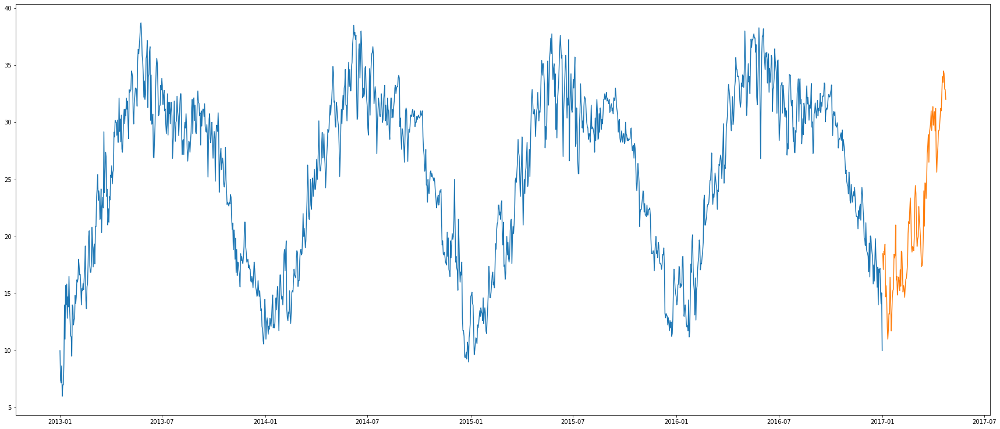

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

from pylab import rcParams
rcParams['figure.figsize']=30,13



plt.plot(train['meantemp'])
plt.plot(test['meantemp'])

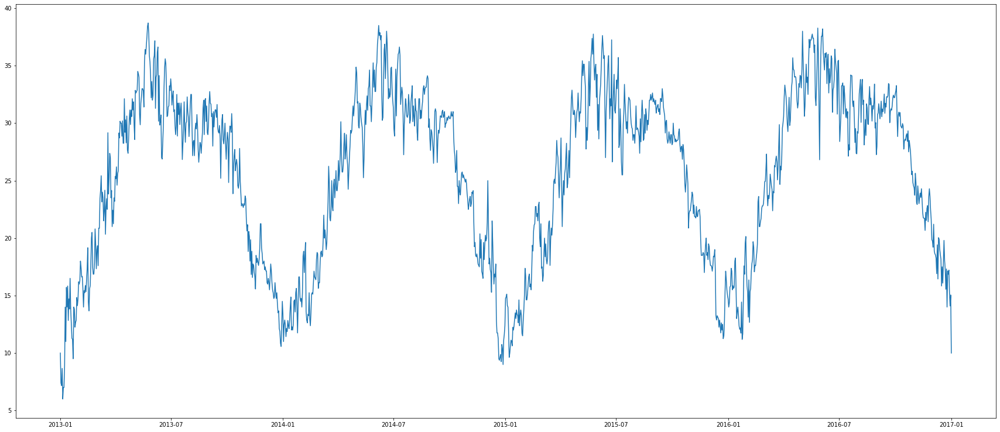

In [ ]:
plt.plot(train['meantemp'])

# Arima Model.

In [ ]:
data=train.copy(deep=True)

In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    #Determing rolling statistics
    MA = timeseries.rolling(window=12).mean()
    MSTD = timeseries.rolling(window=12).std()

    #Plot rolling statistics:
    plt.figure(figsize=(15,5))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(MA, color='red', label='Rolling Mean')
    std = plt.plot(MSTD, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    # Check for stationarity
    if dftest[1] < 0.05:
        print("Data is stationary")
    else:
        print("Data is not stationary")

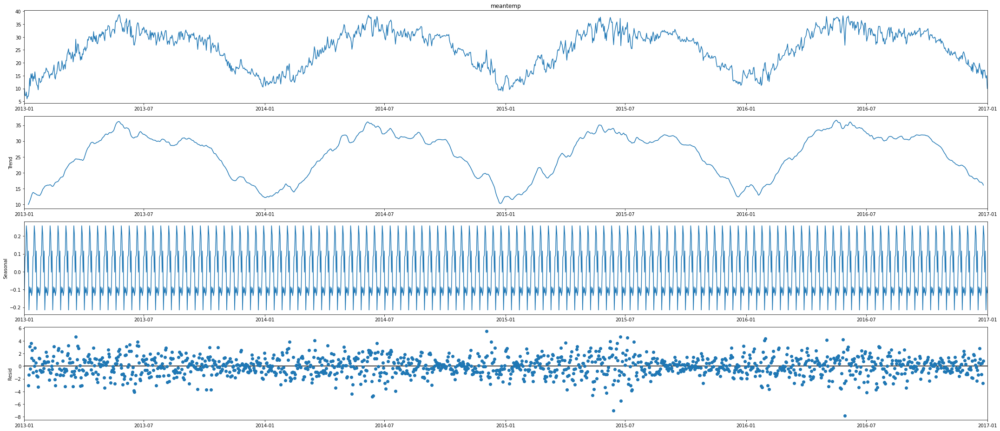

In [ ]:
import statsmodels.tsa.api as smt


dec = smt.seasonal_decompose(data['meantemp'],period = 12,model = 'additive').plot()
plt.show()

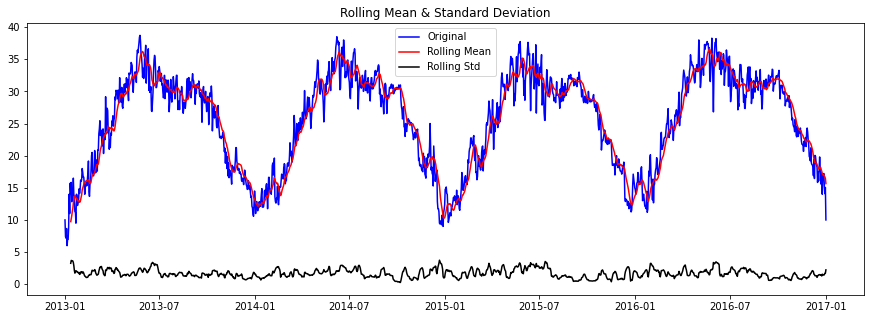

Results of Dickey-Fuller Test:
Test Statistic                  -2.02
p-value                          0.28
#Lags Used                      10.00
Number of Observations Used   1451.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Data is not stationary


In [ ]:
test_stationarity(data['meantemp'])

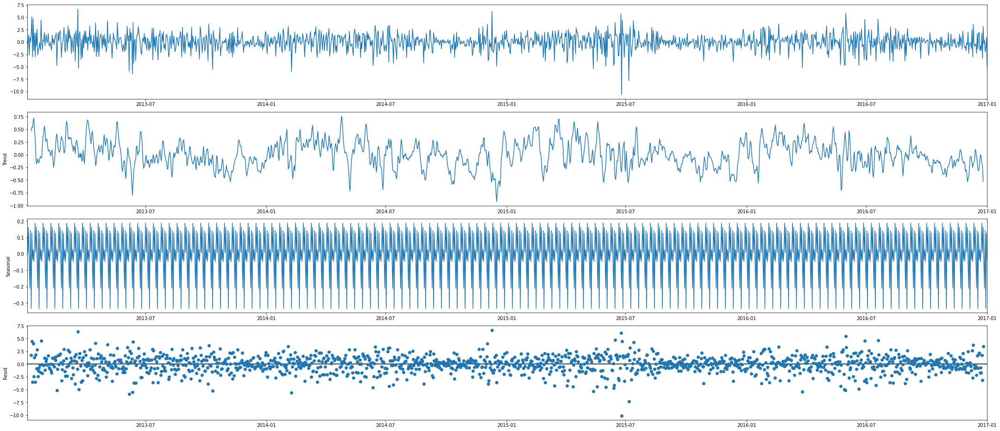

In [ ]:
data_diff = data.diff()
data_diff = data_diff.dropna()

dec = smt.seasonal_decompose(data_diff,period = 12).plot()
plt.show()

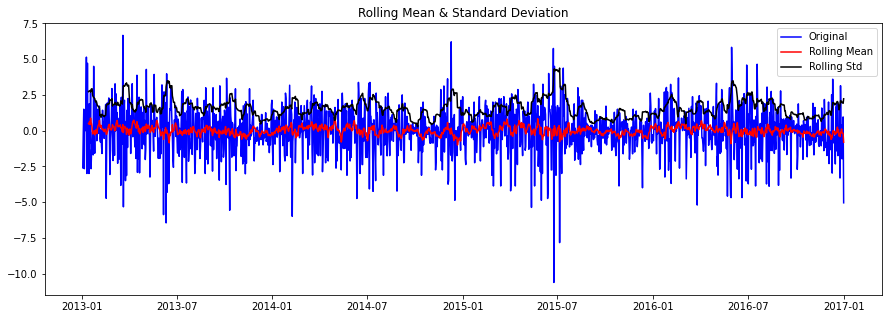

Results of Dickey-Fuller Test:
Test Statistic                 -16.38
p-value                          0.00
#Lags Used                       9.00
Number of Observations Used   1451.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Data is stationary


In [ ]:
test_stationarity(data_diff)

In [ ]:
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.api as sm

def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        # acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 0))
        acf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        # smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        plt.tight_layout()

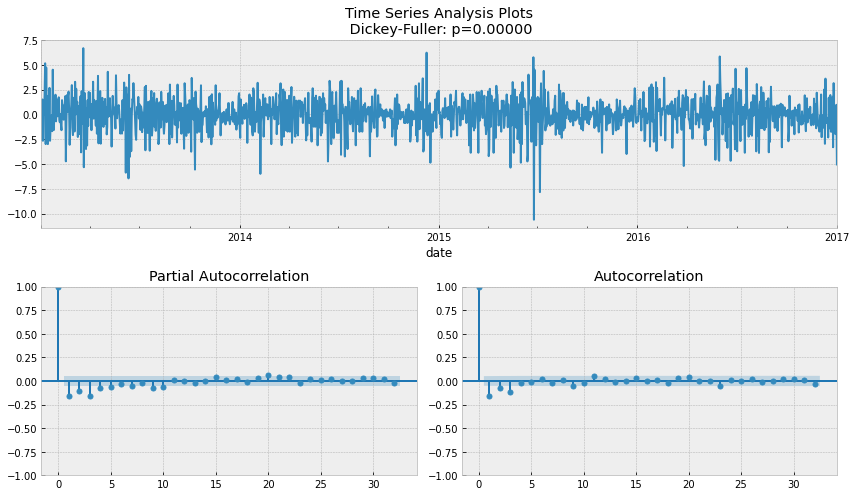

In [ ]:
tsplot(data_diff['meantemp'])

In [ ]:
from statsmodels.tsa.arima.model import ARIMA as ARIMA
arima_model = ARIMA(data_diff,order = (3,0,3))
arima_model_fit = arima_model.fit()

In [ ]:
arima_diff_prediction=arima_model_fit.predict(start=len(data_diff), end=len(data_diff)+112)

In [ ]:
arima_diff_prediction.head()

2017-01-02   1.34
2017-01-03   0.70
2017-01-04   0.76
2017-01-05   0.13
2017-01-06   0.18
Freq: D, Name: predicted_mean, dtype: float64

In [ ]:
arima_prediction=np.cumsum(arima_diff_prediction) + data.iloc[-1,0]

In [ ]:
data.tail()

,meantemp
date,
2016-12-28,17.22
2016-12-29,15.24
2016-12-30,14.10
2016-12-31,15.05
2017-01-01,10.00


In [ ]:
arima_prediction.head()

2017-01-02   11.34
2017-01-03   12.04
2017-01-04   12.80
2017-01-05   12.93
2017-01-06   13.11
Freq: D, Name: predicted_mean, dtype: float64

In [ ]:
arima_prediction.tail()

2017-04-20   13.36
2017-04-21   13.36
2017-04-22   13.37
2017-04-23   13.37
2017-04-24   13.37
Freq: D, Name: predicted_mean, dtype: float64

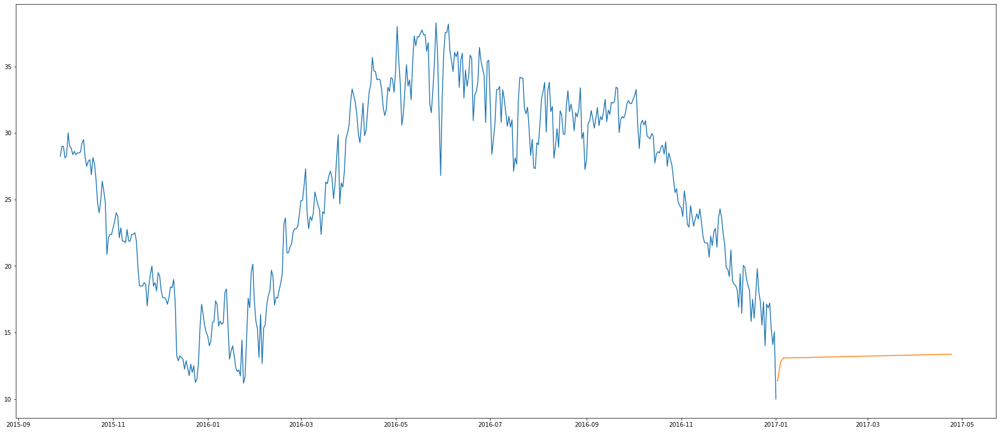

In [ ]:
plt.plot(data[1000:])
plt.plot(arima_prediction)

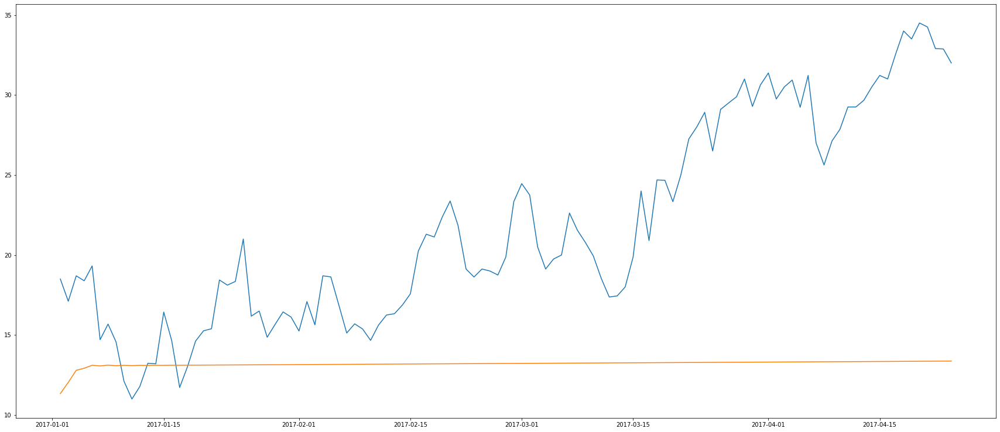

In [ ]:
plt.plot(test)
plt.plot(arima_prediction)

In [ ]:
test.shape

(113, 1)

In [ ]:
arima_prediction.shape

(113,)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_1 = mean_absolute_percentage_error(test,arima_prediction)
# mse = mean_squared_error(test, arima_prediction)
print(f"mean absolute percentage error is: {mape_1:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


# Sarima Model.

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
sarima_model = SARIMAX(data_diff, order=(3, 0, 3), seasonal_order=(3, 0, 3, 12))
sarima_model_fit = sarima_model.fit()

In [ ]:
sarima_diff_prediction=sarima_model_fit.predict(start=len(data_diff), end=len(data_diff)+112)

In [ ]:
sarima_prediction=np.cumsum(sarima_diff_prediction) + data.iloc[-1,0]

In [ ]:
data.tail()

,meantemp
date,
2016-12-28,17.22
2016-12-29,15.24
2016-12-30,14.10
2016-12-31,15.05
2017-01-01,10.00


In [ ]:
sarima_prediction.head()

2017-01-02   11.21
2017-01-03   11.94
2017-01-04   12.48
2017-01-05   12.75
2017-01-06   12.74
Freq: D, Name: predicted_mean, dtype: float64

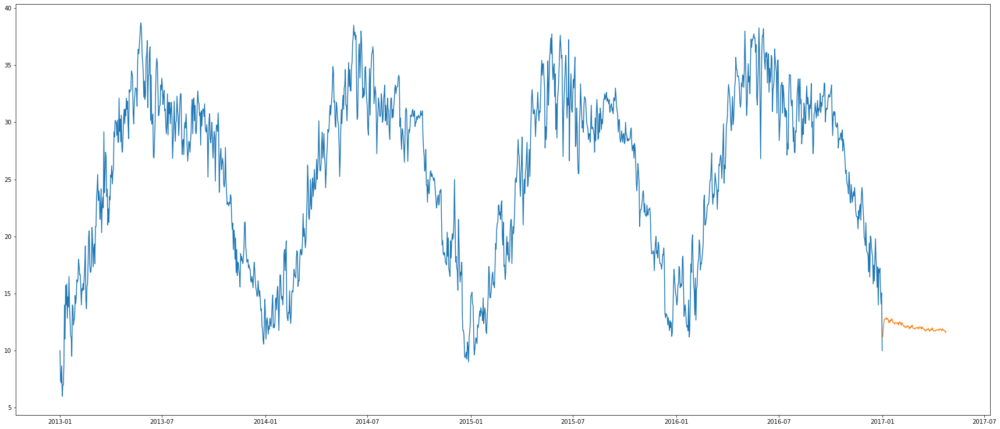

In [ ]:
plt.plot(data)
plt.plot(sarima_prediction)

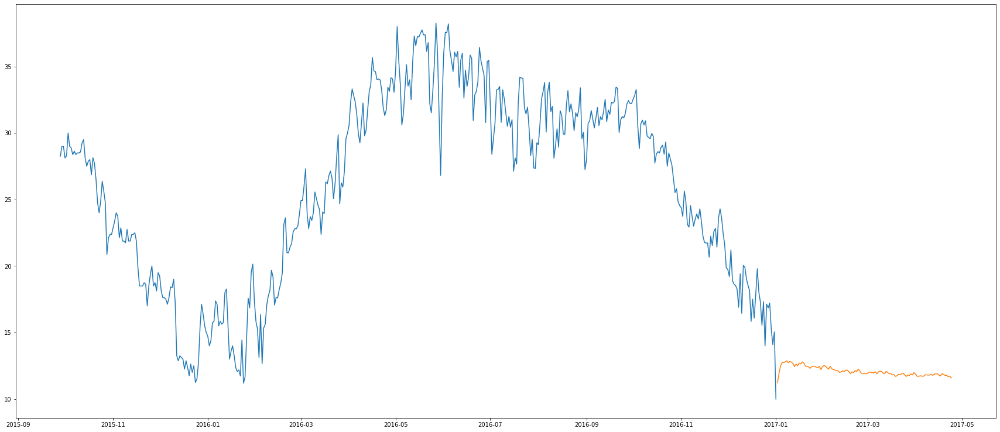

In [ ]:
plt.plot(data[1000:])
plt.plot(sarima_prediction)

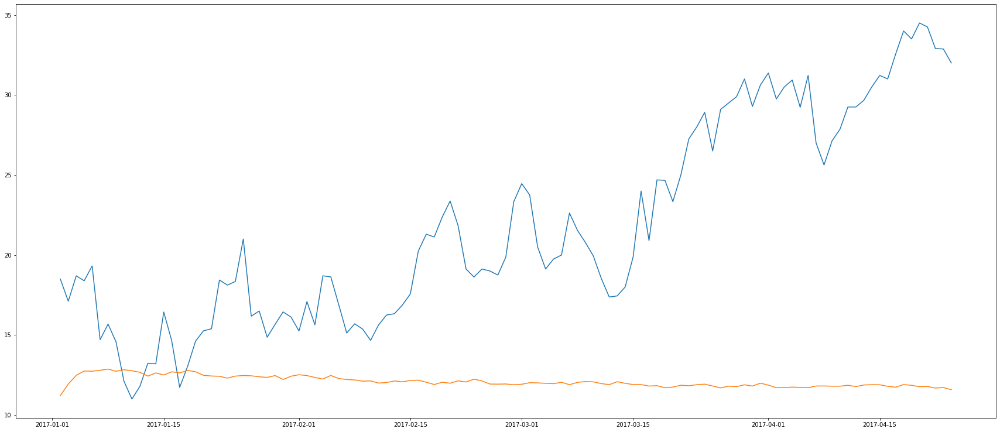

In [ ]:
plt.plot(test)
plt.plot(sarima_prediction)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_2 = mean_absolute_percentage_error(test,sarima_prediction)
# mse = mean_squared_error(test, sarima_prediction)
print(f"mean absolute percentage error is: {mape_2:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.40


# Auto arima Model.

AutoArima model with seasonal false on statioary data

In [ ]:
!pip install pmdarima --quiet
import pmdarima as pm
first_auto_arima_model=pm.auto_arima(data_diff['meantemp'], seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=2.28 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5648.181, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.90 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.61 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=1.37 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5542.478, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5600.115, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5544.118, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]          

In [ ]:
first_auto_arima_model_fit=first_auto_arima_model.fit(data_diff['meantemp'])

In [ ]:
first_auto_arima_diff_pred_value= first_auto_arima_model_fit.predict(n_periods=113)

In [ ]:
first_auto_arima_pred_value=np.cumsum(first_auto_arima_diff_pred_value) + data.iloc[-1,0]

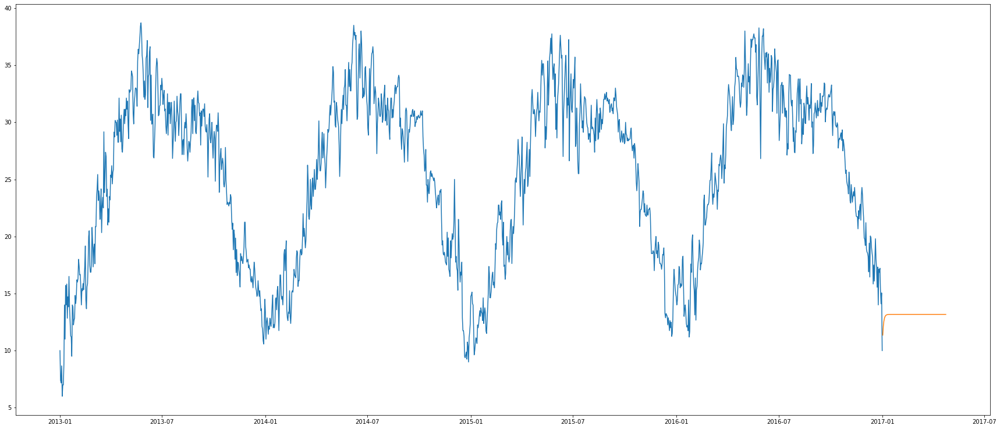

In [ ]:
plt.plot(data)
plt.plot(first_auto_arima_pred_value)

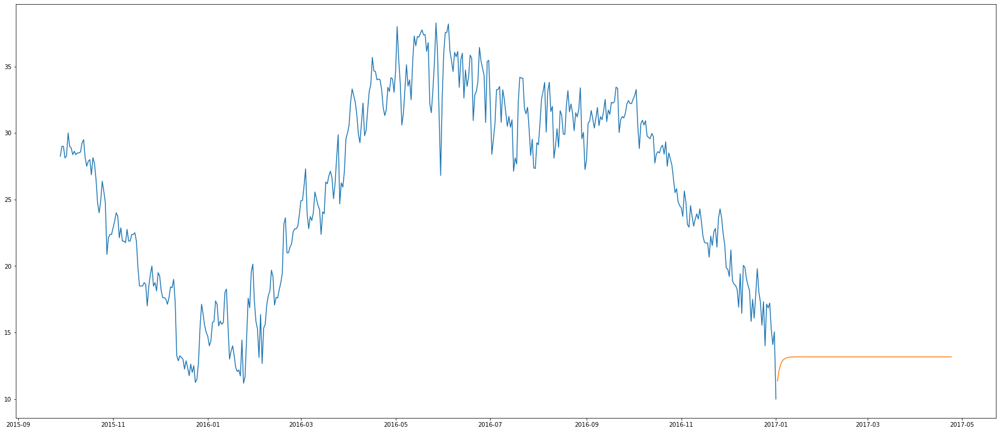

In [ ]:
plt.plot(data[1000:])
plt.plot(first_auto_arima_pred_value)

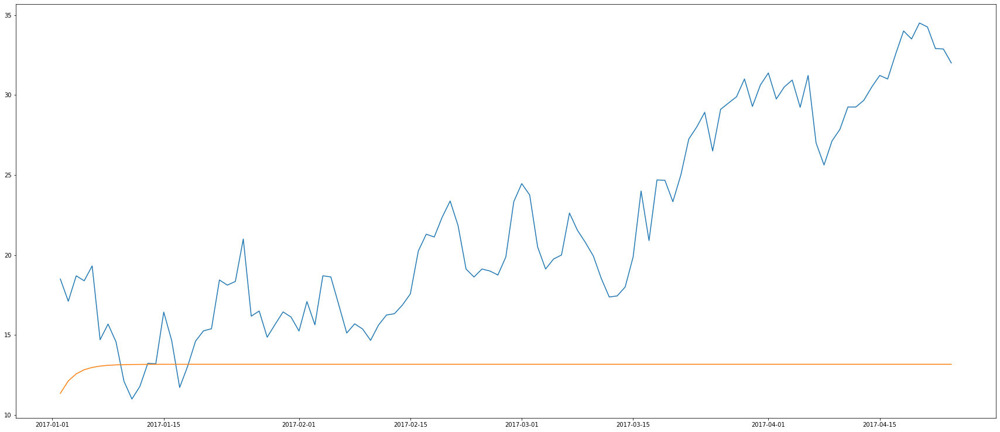

In [ ]:
plt.plot(test)
plt.plot(first_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_3 = mean_absolute_percentage_error(test,first_auto_arima_pred_value)
# mse = mean_squared_error(test, first_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_3:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal True on statioary data

In [ ]:
second_auto_arima_model=pm.auto_arima(data_diff['meantemp'], seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5648.181, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.41 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.71 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5542.478, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5600.115, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5544.118, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[0]          

In [ ]:
second_auto_arima_model_fit=second_auto_arima_model.fit(data_diff['meantemp'])

In [ ]:
second_auto_arima_diff_pred_value= second_auto_arima_model_fit.predict(n_periods=113)

In [ ]:
second_auto_arima_pred_value=np.cumsum(second_auto_arima_diff_pred_value) + data.iloc[-1,0]

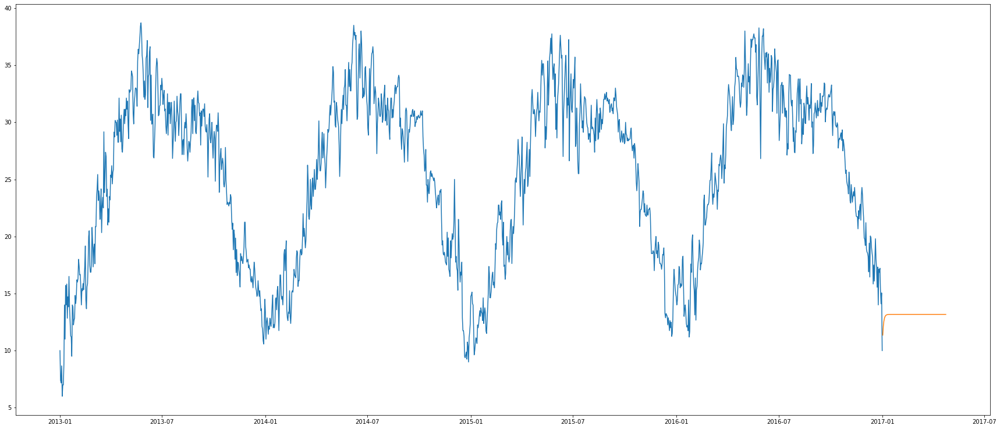

In [ ]:
plt.plot(data)
plt.plot(second_auto_arima_pred_value)

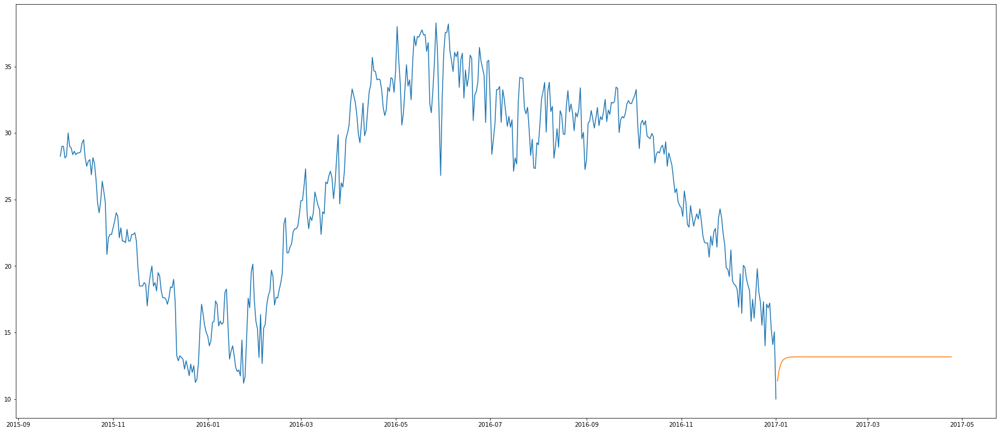

In [ ]:
plt.plot(data[1000:])
plt.plot(second_auto_arima_pred_value)

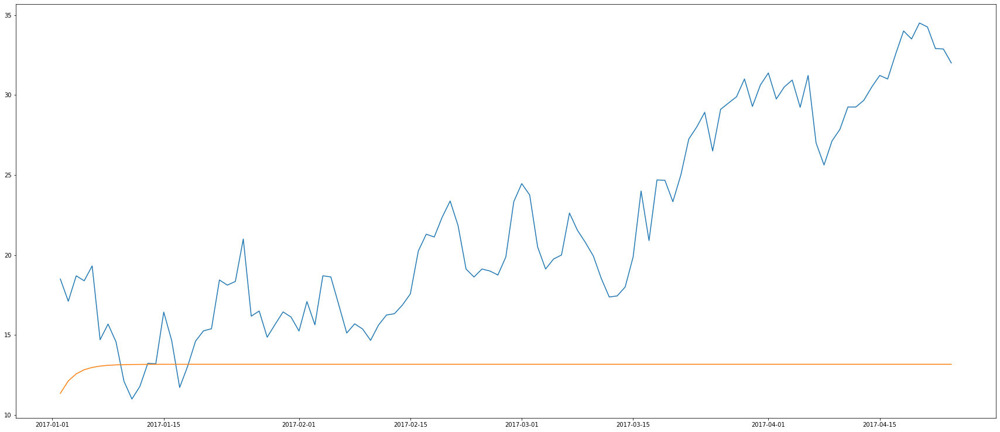

In [ ]:
plt.plot(test)
plt.plot(second_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_4 = mean_absolute_percentage_error(test,second_auto_arima_pred_value)
# mse = mean_squared_error(test, second_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_4:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal false on non-statioary data

In [ ]:
third_auto_arima_model=pm.auto_arima(data['meantemp'], seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=False)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5648.181, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.76 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5542.478, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5600.115, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5612.068, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=5544.118, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
third_auto_arima_model_fit=third_auto_arima_model.fit(data['meantemp'])

In [ ]:
third_auto_arima_pred_value=third_auto_arima_model_fit.predict(n_periods=113)

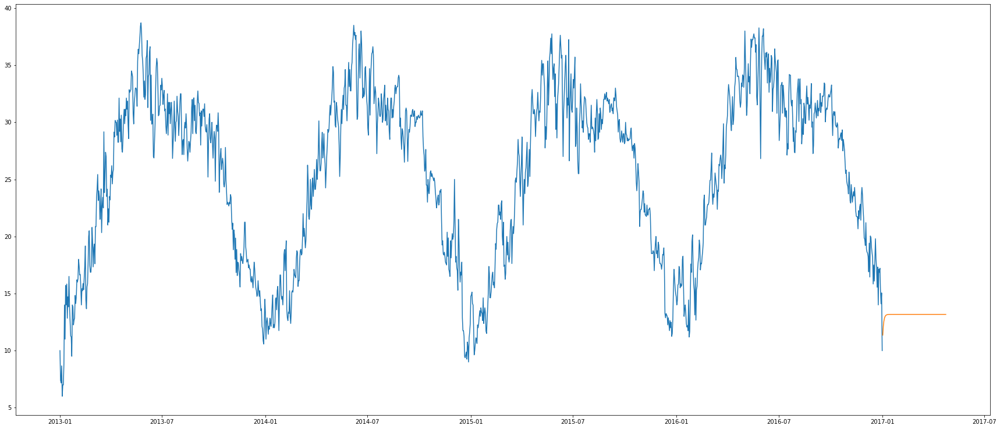

In [ ]:
plt.plot(data)
plt.plot(third_auto_arima_pred_value)

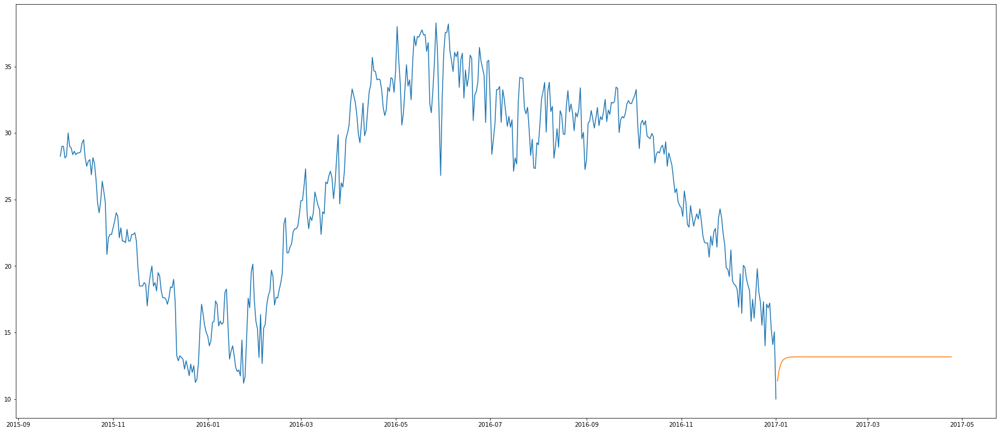

In [ ]:
plt.plot(data[1000:])
plt.plot(third_auto_arima_pred_value)

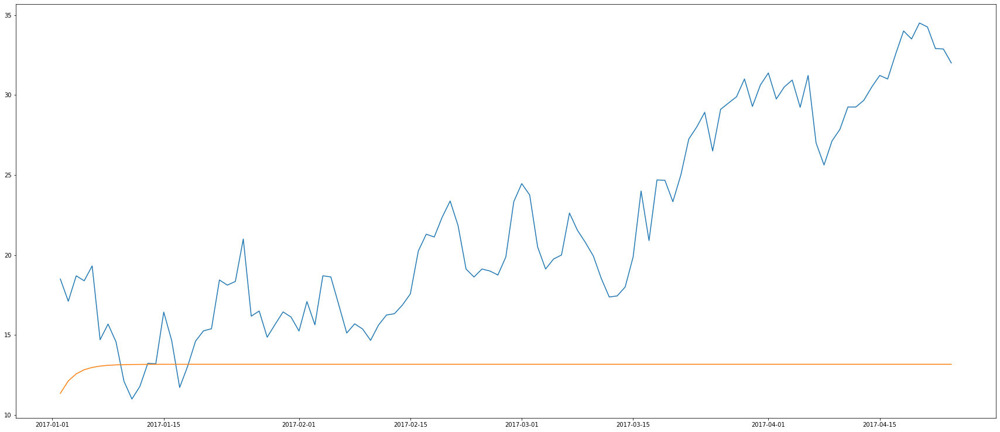

In [ ]:
plt.plot(test)
plt.plot(third_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_5 = mean_absolute_percentage_error(test,third_auto_arima_pred_value)
# mse = mean_squared_error(test, third_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_5:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal True on non-statioary data

In [ ]:
fourth_auto_arima_model=pm.auto_arima(data['meantemp'], seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=False)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=2.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5648.181, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.77 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.29 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5542.478, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5600.115, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=5544.118, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
fourth_auto_arima_model_fit=fourth_auto_arima_model.fit(data['meantemp'])

In [ ]:
fourth_auto_arima_pred_value=fourth_auto_arima_model_fit.predict(n_periods=113)

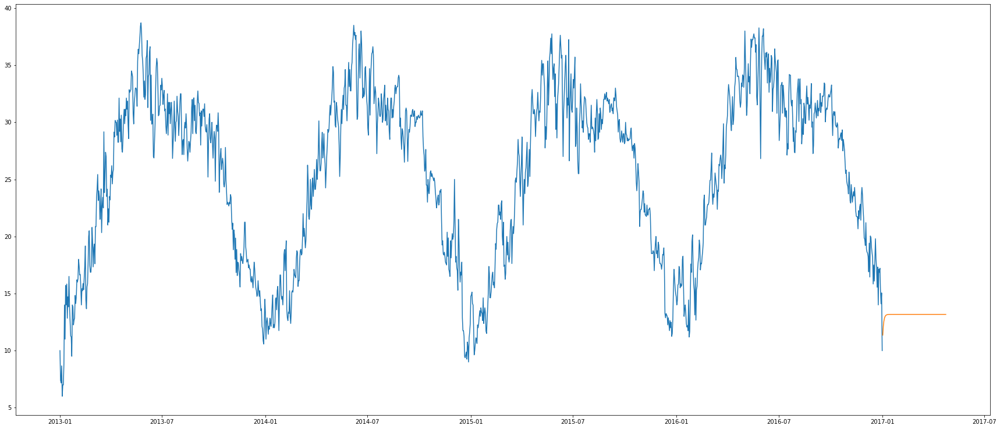

In [ ]:
plt.plot(data)
plt.plot(fourth_auto_arima_pred_value)

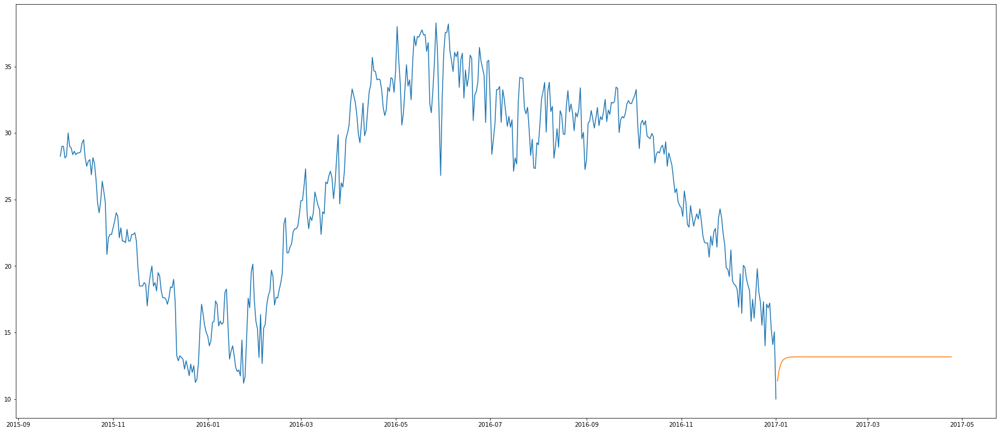

In [ ]:
plt.plot(data[1000:])
plt.plot(fourth_auto_arima_pred_value)

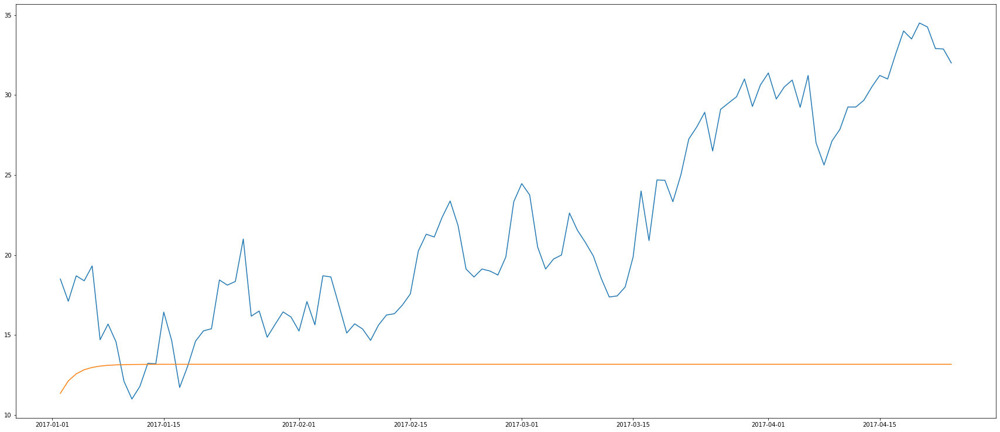

In [ ]:
plt.plot(test)
plt.plot(fourth_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_6 = mean_absolute_percentage_error(test,fourth_auto_arima_pred_value)
# mse = mean_squared_error(test, fourth_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_6:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


# Choosing the best model.

In [ ]:
# compare the MAPE scores and select the best model
best_model = np.argmin([mape_1,mape_2,mape_3,mape_4,mape_5,mape_6]) + 1
print(f"The best model is Model {best_model}")

The best model is Model 1


# Data loading.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

train=pd.read_csv('/content/drive/MyDrive/All_Datasets/Time_series/Weather_forecasting/DailyDelhiClimateTrain.csv')
test=pd.read_csv('/content/drive/MyDrive/All_Datasets/Time_series/Weather_forecasting/DailyDelhiClimateTest.csv')

In [ ]:
train.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.00,84.50,0.00,1015.67
1,2013-01-02,7.40,92.00,2.98,1017.80
2,2013-01-03,7.17,87.00,4.63,1018.67
3,2013-01-04,8.67,71.33,1.23,1017.17
4,2013-01-05,6.00,86.83,3.70,1016.50


In [ ]:
train.tail()

,date,meantemp,humidity,wind_speed,meanpressure
1457,2016-12-28,17.22,68.04,3.55,1015.57
1458,2016-12-29,15.24,87.86,6.00,1016.90
1459,2016-12-30,14.10,89.67,6.27,1017.90
1460,2016-12-31,15.05,87.00,7.33,1016.10
1461,2017-01-01,10.00,100.00,0.00,1016.00


In [ ]:
test.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2017-01-01,15.91,85.87,2.74,59.00
1,2017-01-02,18.50,77.22,2.89,1018.28
2,2017-01-03,17.11,81.89,4.02,1018.33
3,2017-01-04,18.70,70.05,4.54,1015.70
4,2017-01-05,18.39,74.94,3.30,1014.33


In [ ]:
len(test)

114

In [ ]:
test=test.drop(0)


In [ ]:
len(test)

113

In [ ]:
test.head()

,date,meantemp,humidity,wind_speed,meanpressure
1,2017-01-02,18.50,77.22,2.89,1018.28
2,2017-01-03,17.11,81.89,4.02,1018.33
3,2017-01-04,18.70,70.05,4.54,1015.70
4,2017-01-05,18.39,74.94,3.30,1014.33
5,2017-01-06,19.32,79.32,8.68,1011.77


In [ ]:
train=train.loc[:,['date','meantemp']]
test=test.loc[:,['date','meantemp']]

# EDA

In [ ]:
train.isna().sum()

date        0
meantemp    0
dtype: int64

In [ ]:
test.isna().sum()

date        0
meantemp    0
dtype: int64

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      1462 non-null   object 
 1   meantemp  1462 non-null   float64
dtypes: float64(1), object(1)
memory usage: 23.0+ KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 1 to 113
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      113 non-null    object 
 1   meantemp  113 non-null    float64
dtypes: float64(1), object(1)
memory usage: 1.9+ KB


In [ ]:
train['date']=pd.to_datetime(train['date'])
test['date']=pd.to_datetime(test['date'])

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      1462 non-null   datetime64[ns]
 1   meantemp  1462 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 23.0 KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 1 to 113
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      113 non-null    datetime64[ns]
 1   meantemp  113 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.9 KB


In [ ]:
train=train.set_index('date')
test=test.set_index('date')

In [ ]:
train.head()

,meantemp
date,
2013-01-01,10.00
2013-01-02,7.40
2013-01-03,7.17
2013-01-04,8.67
2013-01-05,6.00


In [ ]:
test.head()

,meantemp
date,
2017-01-02,18.50
2017-01-03,17.11
2017-01-04,18.70
2017-01-05,18.39
2017-01-06,19.32


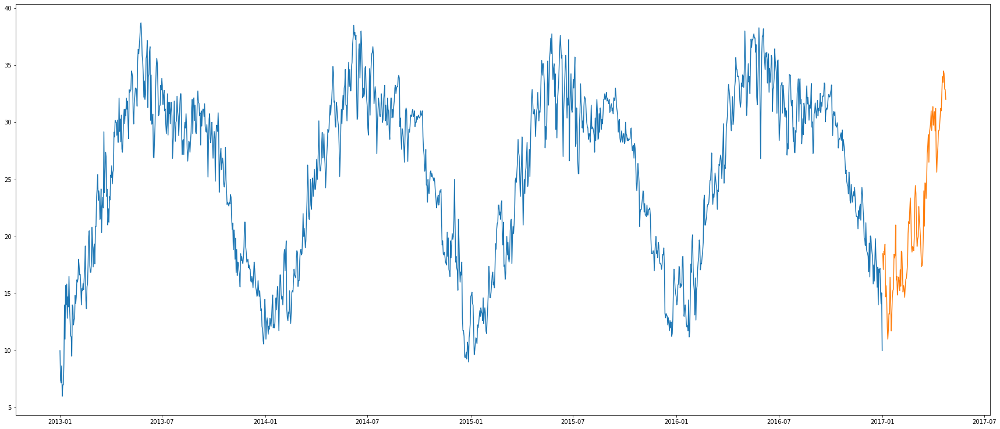

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

from pylab import rcParams
rcParams['figure.figsize']=30,13



plt.plot(train['meantemp'])
plt.plot(test['meantemp'])

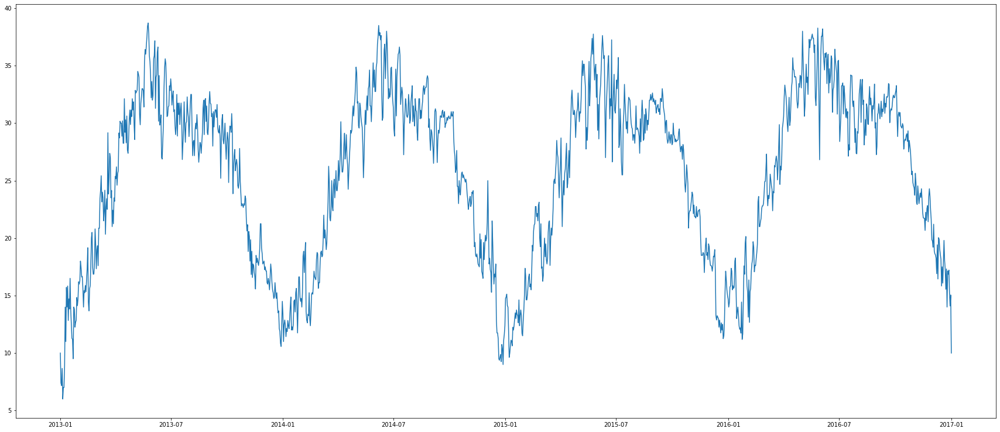

In [ ]:
plt.plot(train['meantemp'])

# Arima Model.

In [ ]:
data=train.copy(deep=True)

In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    #Determing rolling statistics
    MA = timeseries.rolling(window=12).mean()
    MSTD = timeseries.rolling(window=12).std()

    #Plot rolling statistics:
    plt.figure(figsize=(15,5))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(MA, color='red', label='Rolling Mean')
    std = plt.plot(MSTD, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    # Check for stationarity
    if dftest[1] < 0.05:
        print("Data is stationary")
    else:
        print("Data is not stationary")

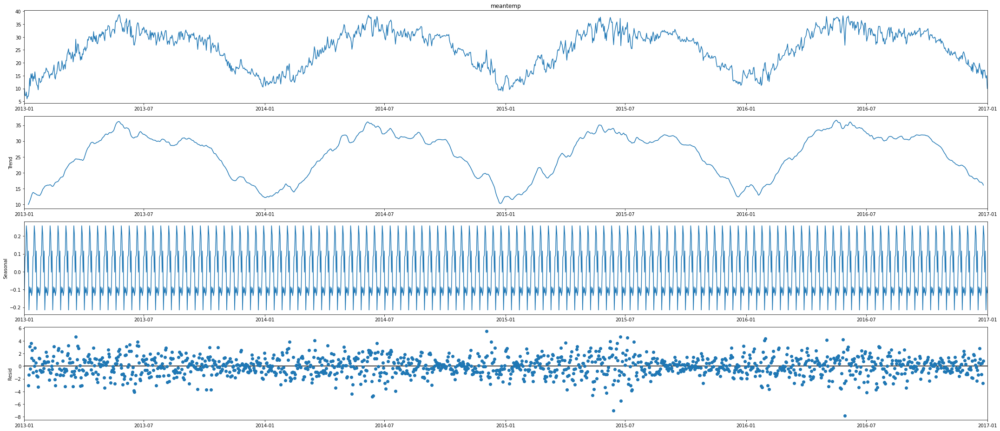

In [ ]:
import statsmodels.tsa.api as smt


dec = smt.seasonal_decompose(data['meantemp'],period = 12,model = 'additive').plot()
plt.show()

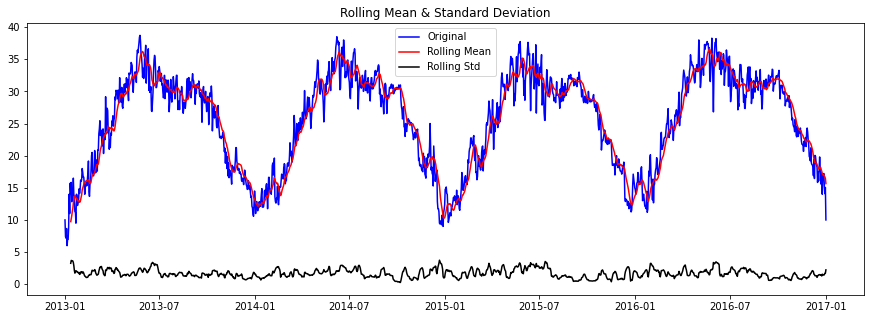

Results of Dickey-Fuller Test:
Test Statistic                  -2.02
p-value                          0.28
#Lags Used                      10.00
Number of Observations Used   1451.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Data is not stationary


In [ ]:
test_stationarity(data['meantemp'])

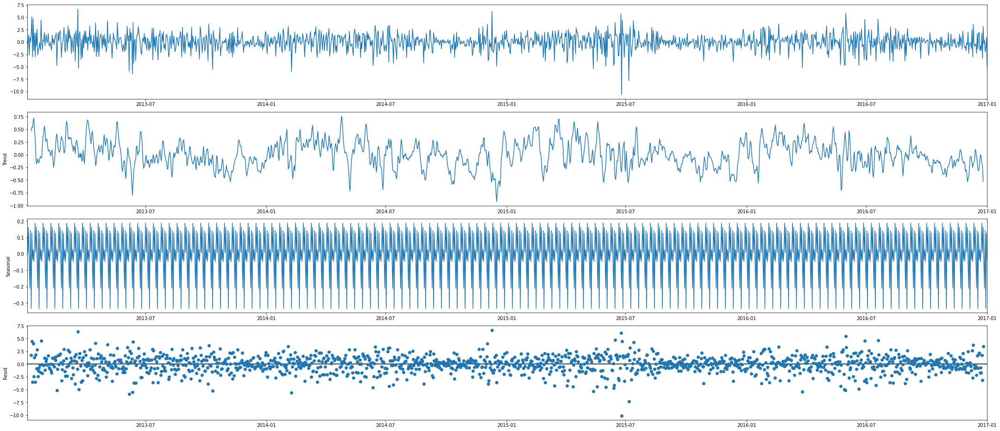

In [ ]:
data_diff = data.diff()
data_diff = data_diff.dropna()

dec = smt.seasonal_decompose(data_diff,period = 12).plot()
plt.show()

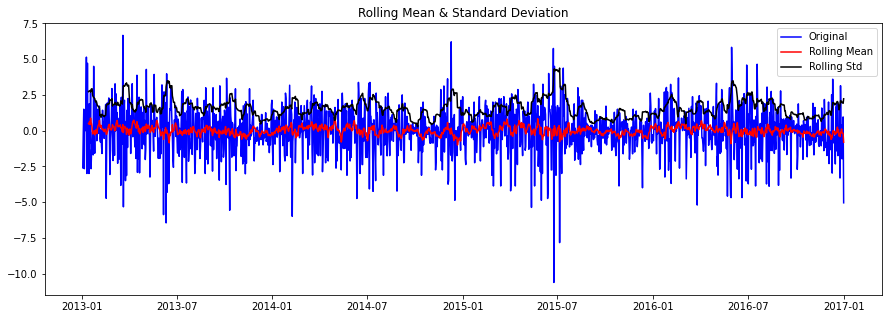

Results of Dickey-Fuller Test:
Test Statistic                 -16.38
p-value                          0.00
#Lags Used                       9.00
Number of Observations Used   1451.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Data is stationary


In [ ]:
test_stationarity(data_diff)

In [ ]:
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.api as sm

def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        # acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 0))
        acf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        # smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        plt.tight_layout()

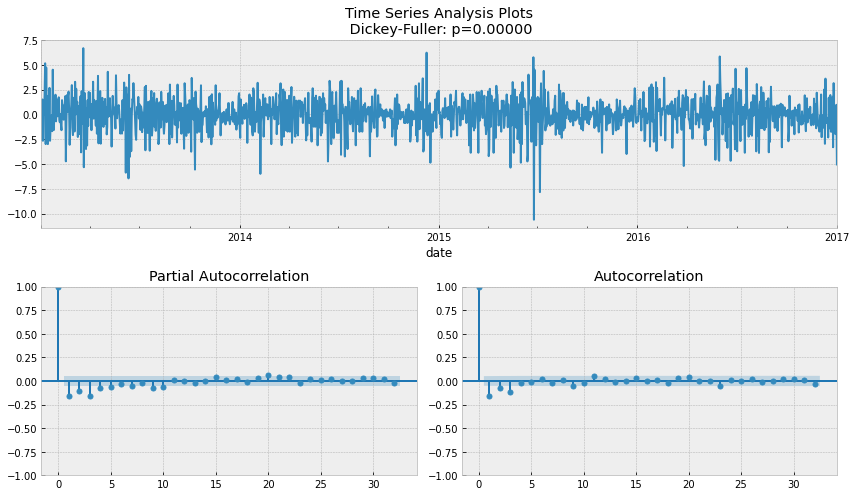

In [ ]:
tsplot(data_diff['meantemp'])

In [ ]:
from statsmodels.tsa.arima.model import ARIMA as ARIMA
arima_model = ARIMA(data_diff,order = (3,0,3))
arima_model_fit = arima_model.fit()

In [ ]:
arima_diff_prediction=arima_model_fit.predict(start=len(data_diff), end=len(data_diff)+112)

In [ ]:
arima_diff_prediction.head()

2017-01-02   1.34
2017-01-03   0.70
2017-01-04   0.76
2017-01-05   0.13
2017-01-06   0.18
Freq: D, Name: predicted_mean, dtype: float64

In [ ]:
arima_prediction=np.cumsum(arima_diff_prediction) + data.iloc[-1,0]

In [ ]:
data.tail()

,meantemp
date,
2016-12-28,17.22
2016-12-29,15.24
2016-12-30,14.10
2016-12-31,15.05
2017-01-01,10.00


In [ ]:
arima_prediction.head()

2017-01-02   11.34
2017-01-03   12.04
2017-01-04   12.80
2017-01-05   12.93
2017-01-06   13.11
Freq: D, Name: predicted_mean, dtype: float64

In [ ]:
arima_prediction.tail()

2017-04-20   13.36
2017-04-21   13.36
2017-04-22   13.37
2017-04-23   13.37
2017-04-24   13.37
Freq: D, Name: predicted_mean, dtype: float64

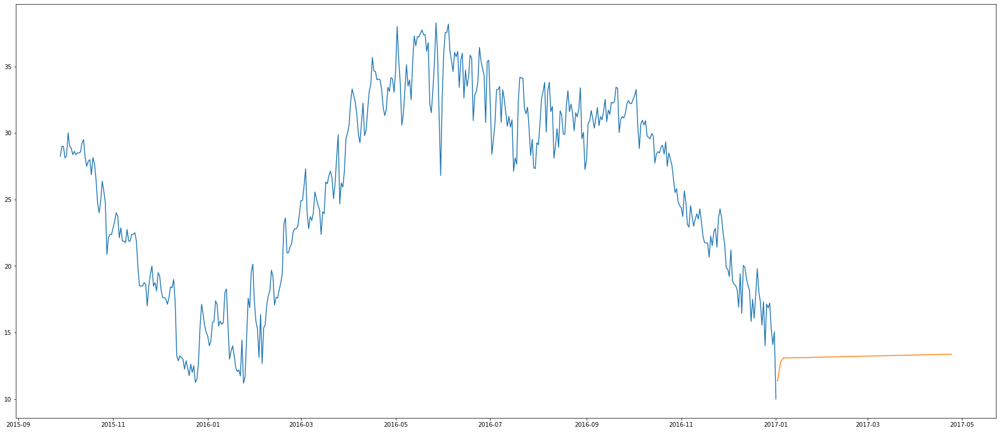

In [ ]:
plt.plot(data[1000:])
plt.plot(arima_prediction)

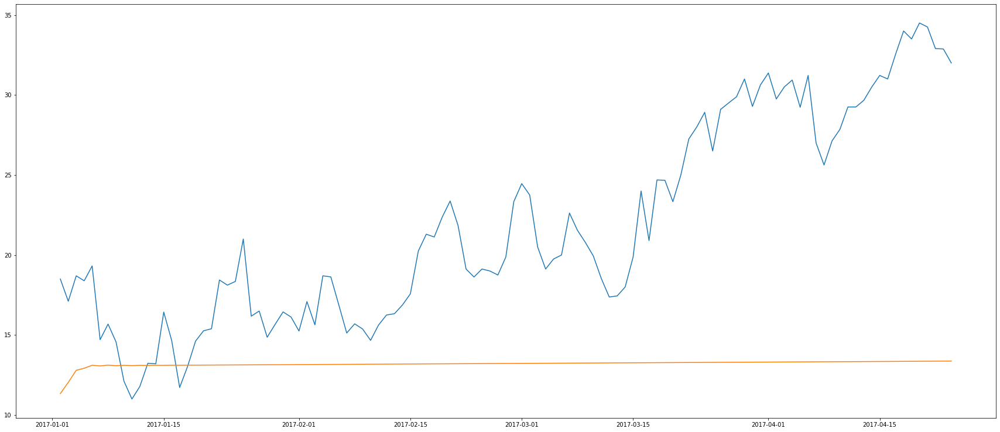

In [ ]:
plt.plot(test)
plt.plot(arima_prediction)

In [ ]:
test.shape

(113, 1)

In [ ]:
arima_prediction.shape

(113,)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_1 = mean_absolute_percentage_error(test,arima_prediction)
# mse = mean_squared_error(test, arima_prediction)
print(f"mean absolute percentage error is: {mape_1:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


# Sarima Model.

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
sarima_model = SARIMAX(data_diff, order=(3, 0, 3), seasonal_order=(3, 0, 3, 12))
sarima_model_fit = sarima_model.fit()

In [ ]:
sarima_diff_prediction=sarima_model_fit.predict(start=len(data_diff), end=len(data_diff)+112)

In [ ]:
sarima_prediction=np.cumsum(sarima_diff_prediction) + data.iloc[-1,0]

In [ ]:
data.tail()

,meantemp
date,
2016-12-28,17.22
2016-12-29,15.24
2016-12-30,14.10
2016-12-31,15.05
2017-01-01,10.00


In [ ]:
sarima_prediction.head()

2017-01-02   11.21
2017-01-03   11.94
2017-01-04   12.48
2017-01-05   12.75
2017-01-06   12.74
Freq: D, Name: predicted_mean, dtype: float64

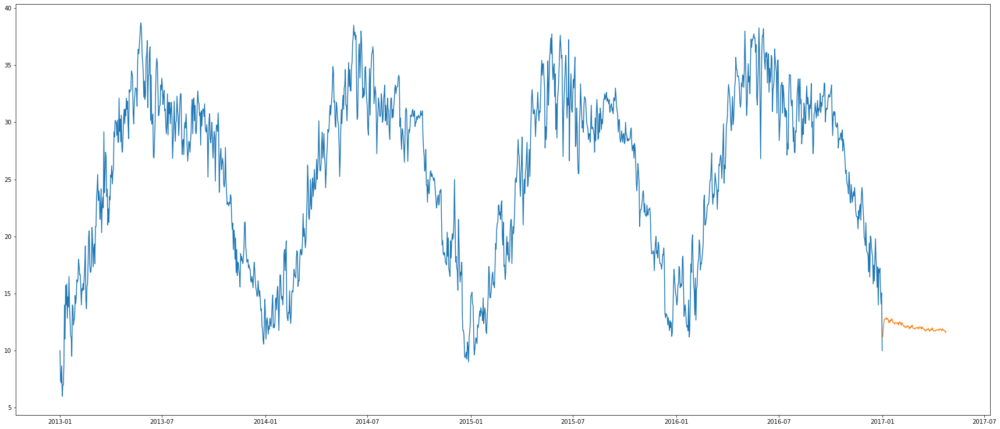

In [ ]:
plt.plot(data)
plt.plot(sarima_prediction)

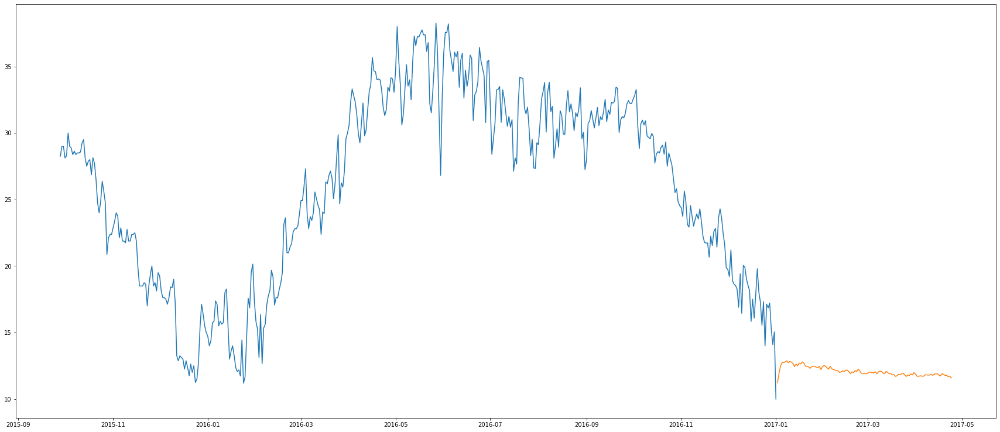

In [ ]:
plt.plot(data[1000:])
plt.plot(sarima_prediction)

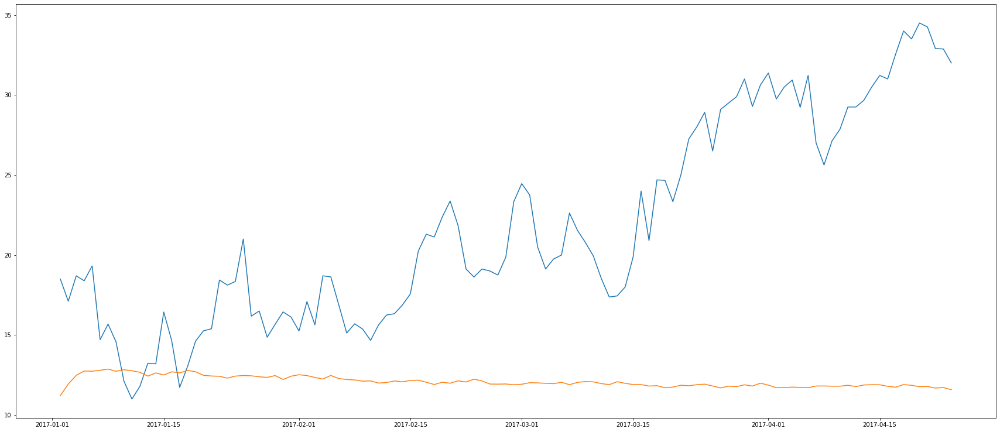

In [ ]:
plt.plot(test)
plt.plot(sarima_prediction)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_2 = mean_absolute_percentage_error(test,sarima_prediction)
# mse = mean_squared_error(test, sarima_prediction)
print(f"mean absolute percentage error is: {mape_2:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.40


# Auto arima Model.

AutoArima model with seasonal false on statioary data

In [ ]:
!pip install pmdarima --quiet
import pmdarima as pm
first_auto_arima_model=pm.auto_arima(data_diff['meantemp'], seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=2.28 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5648.181, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.90 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.61 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=1.37 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5542.478, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5600.115, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5544.118, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]          

In [ ]:
first_auto_arima_model_fit=first_auto_arima_model.fit(data_diff['meantemp'])

In [ ]:
first_auto_arima_diff_pred_value= first_auto_arima_model_fit.predict(n_periods=113)

In [ ]:
first_auto_arima_pred_value=np.cumsum(first_auto_arima_diff_pred_value) + data.iloc[-1,0]

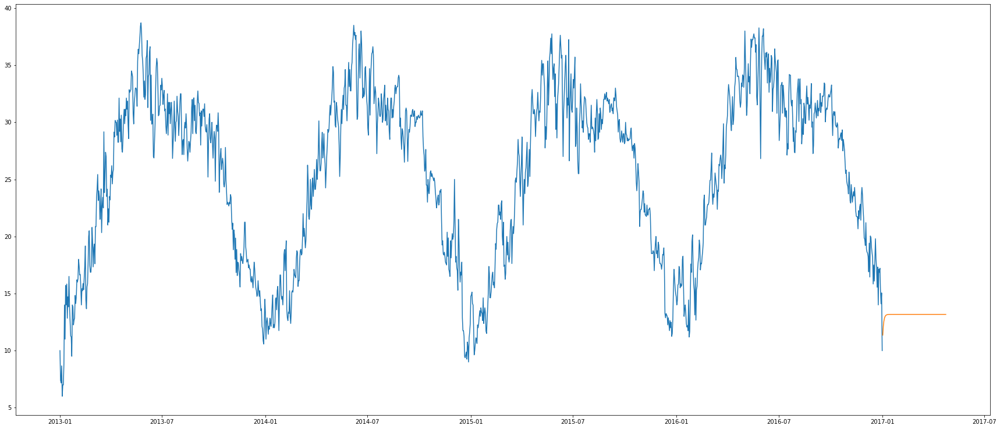

In [ ]:
plt.plot(data)
plt.plot(first_auto_arima_pred_value)

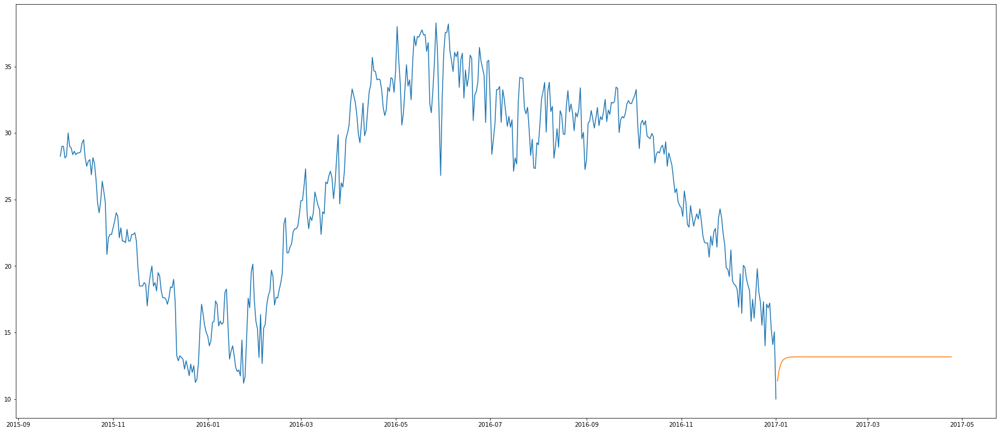

In [ ]:
plt.plot(data[1000:])
plt.plot(first_auto_arima_pred_value)

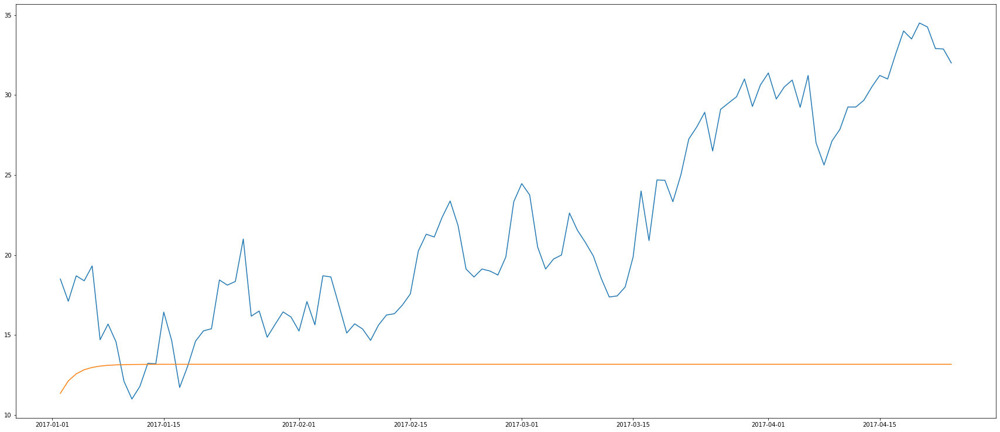

In [ ]:
plt.plot(test)
plt.plot(first_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_3 = mean_absolute_percentage_error(test,first_auto_arima_pred_value)
# mse = mean_squared_error(test, first_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_3:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal True on statioary data

In [ ]:
second_auto_arima_model=pm.auto_arima(data_diff['meantemp'], seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5648.181, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.41 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.71 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5542.478, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5600.115, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5544.118, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[0]          

In [ ]:
second_auto_arima_model_fit=second_auto_arima_model.fit(data_diff['meantemp'])

In [ ]:
second_auto_arima_diff_pred_value= second_auto_arima_model_fit.predict(n_periods=113)

In [ ]:
second_auto_arima_pred_value=np.cumsum(second_auto_arima_diff_pred_value) + data.iloc[-1,0]

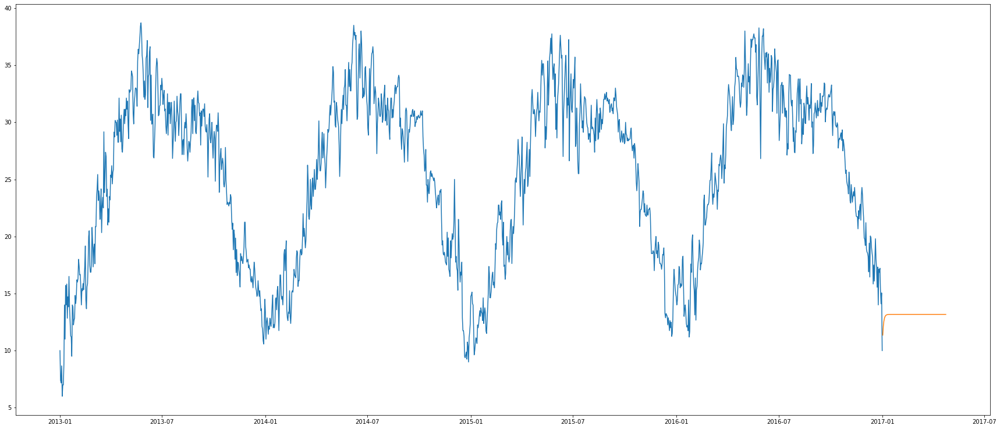

In [ ]:
plt.plot(data)
plt.plot(second_auto_arima_pred_value)

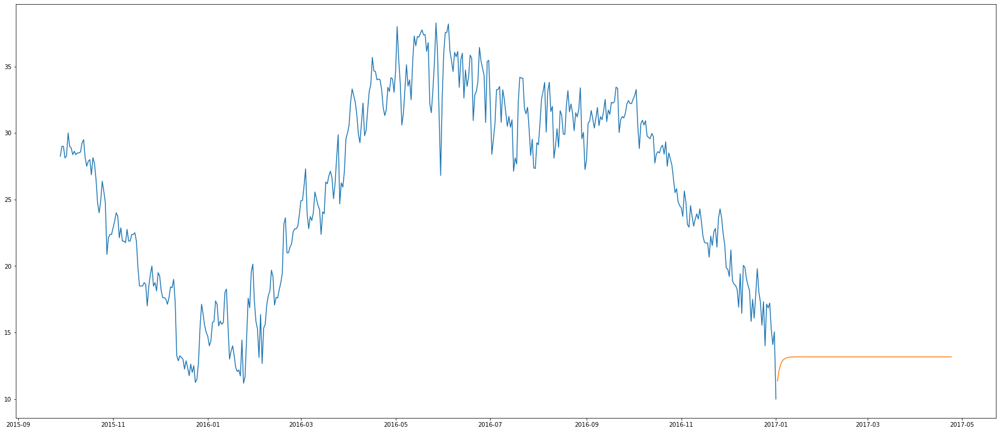

In [ ]:
plt.plot(data[1000:])
plt.plot(second_auto_arima_pred_value)

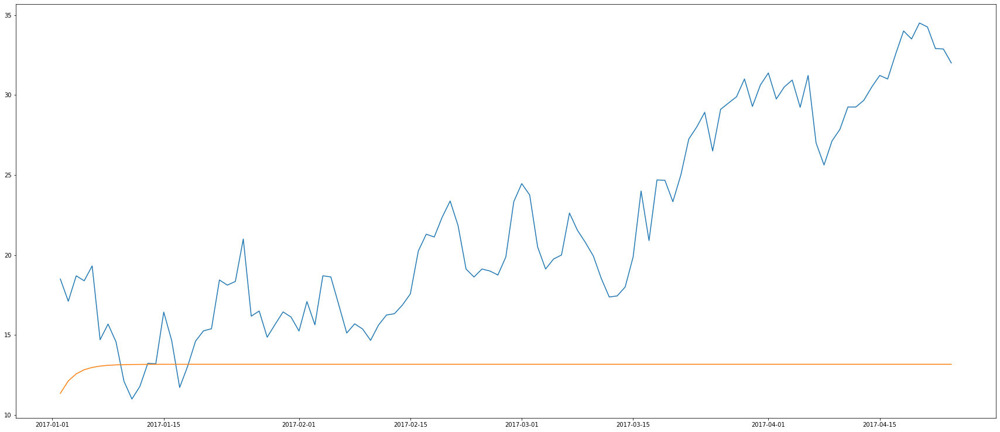

In [ ]:
plt.plot(test)
plt.plot(second_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_4 = mean_absolute_percentage_error(test,second_auto_arima_pred_value)
# mse = mean_squared_error(test, second_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_4:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal false on non-statioary data

In [ ]:
third_auto_arima_model=pm.auto_arima(data['meantemp'], seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=False)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5648.181, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.76 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5542.478, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5600.115, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5612.068, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=5544.118, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
third_auto_arima_model_fit=third_auto_arima_model.fit(data['meantemp'])

In [ ]:
third_auto_arima_pred_value=third_auto_arima_model_fit.predict(n_periods=113)

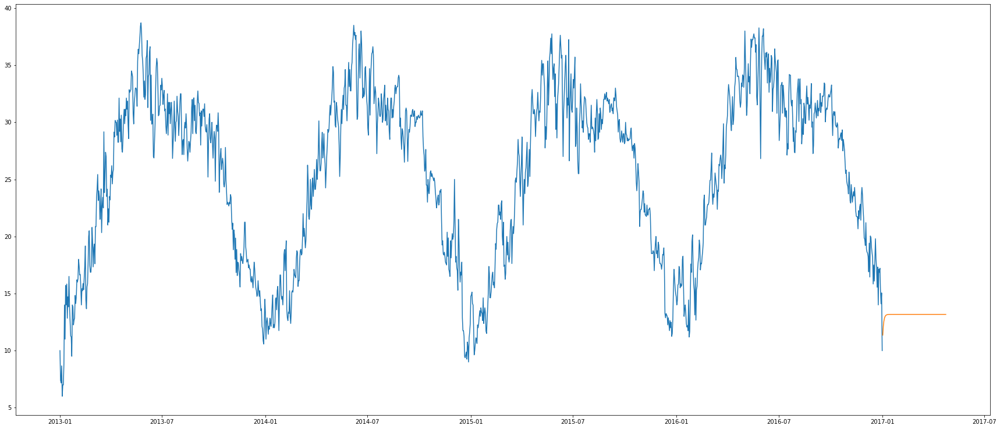

In [ ]:
plt.plot(data)
plt.plot(third_auto_arima_pred_value)

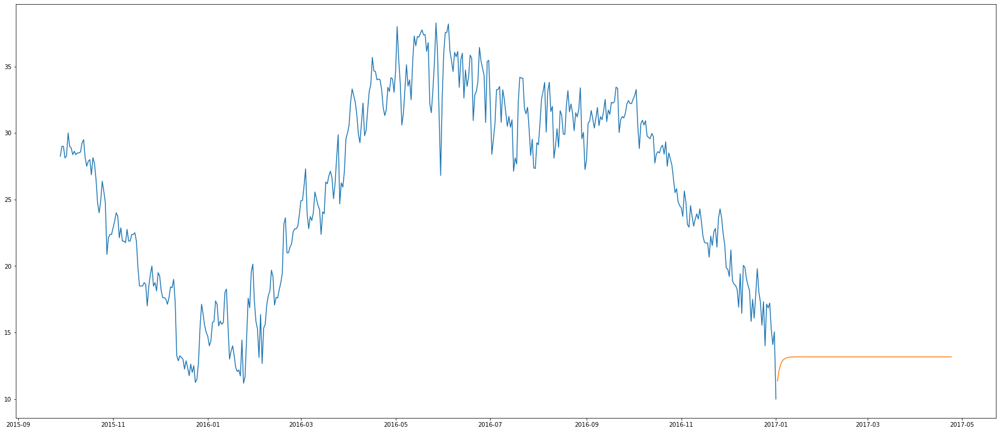

In [ ]:
plt.plot(data[1000:])
plt.plot(third_auto_arima_pred_value)

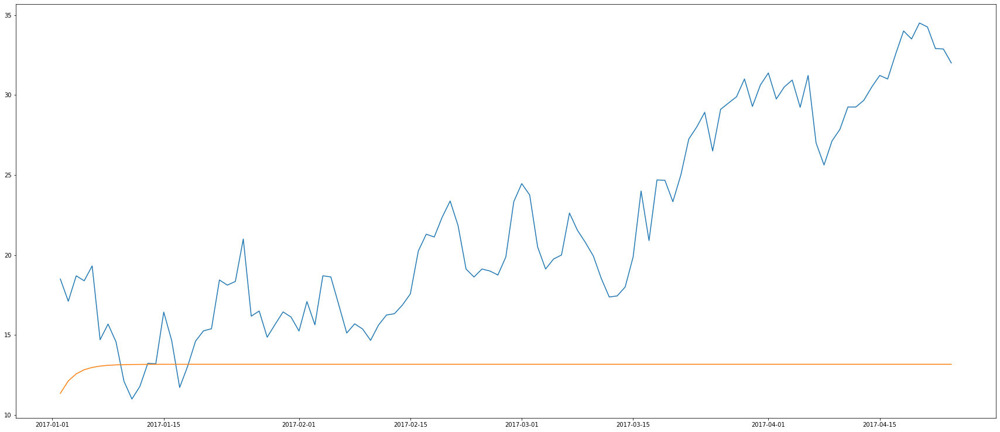

In [ ]:
plt.plot(test)
plt.plot(third_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_5 = mean_absolute_percentage_error(test,third_auto_arima_pred_value)
# mse = mean_squared_error(test, third_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_5:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal True on non-statioary data

In [ ]:
fourth_auto_arima_model=pm.auto_arima(data['meantemp'], seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=False)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=2.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5648.181, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.77 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.29 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5542.478, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5600.115, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=5544.118, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
fourth_auto_arima_model_fit=fourth_auto_arima_model.fit(data['meantemp'])

In [ ]:
fourth_auto_arima_pred_value=fourth_auto_arima_model_fit.predict(n_periods=113)

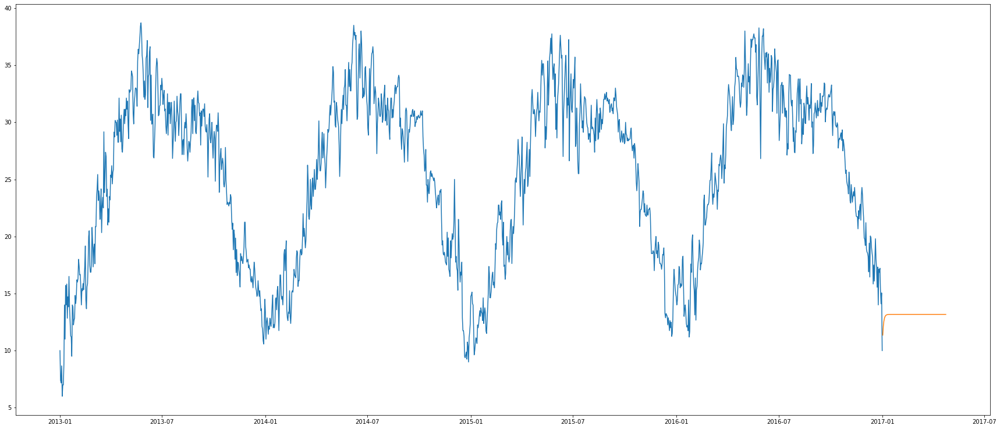

In [ ]:
plt.plot(data)
plt.plot(fourth_auto_arima_pred_value)

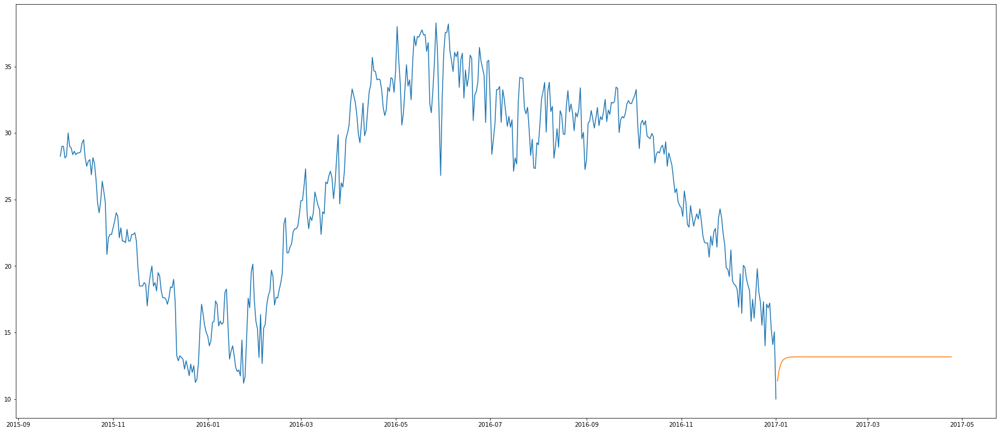

In [ ]:
plt.plot(data[1000:])
plt.plot(fourth_auto_arima_pred_value)

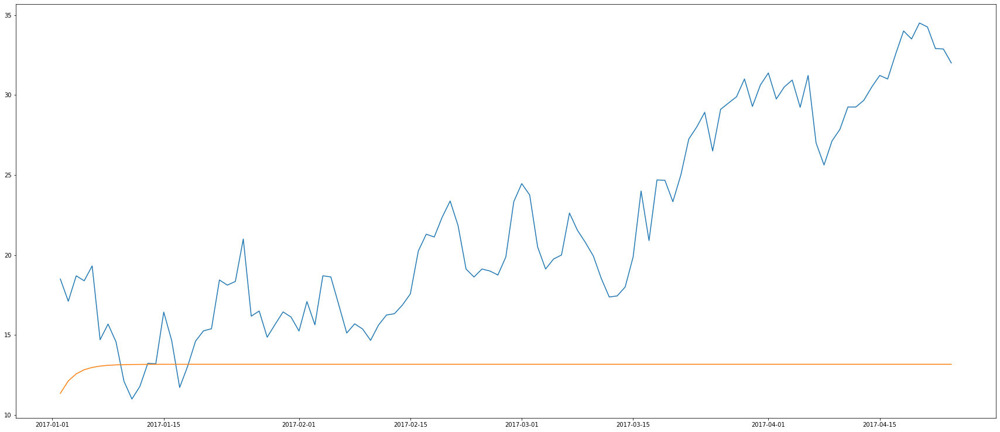

In [ ]:
plt.plot(test)
plt.plot(fourth_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_6 = mean_absolute_percentage_error(test,fourth_auto_arima_pred_value)
# mse = mean_squared_error(test, fourth_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_6:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


# Choosing the best model.

In [ ]:
# compare the MAPE scores and select the best model
best_model = np.argmin([mape_1,mape_2,mape_3,mape_4,mape_5,mape_6]) + 1
print(f"The best model is Model {best_model}")

The best model is Model 1


# Data loading.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

train=pd.read_csv('/content/drive/MyDrive/All_Datasets/Time_series/Weather_forecasting/DailyDelhiClimateTrain.csv')
test=pd.read_csv('/content/drive/MyDrive/All_Datasets/Time_series/Weather_forecasting/DailyDelhiClimateTest.csv')

In [ ]:
train.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.00,84.50,0.00,1015.67
1,2013-01-02,7.40,92.00,2.98,1017.80
2,2013-01-03,7.17,87.00,4.63,1018.67
3,2013-01-04,8.67,71.33,1.23,1017.17
4,2013-01-05,6.00,86.83,3.70,1016.50


In [ ]:
train.tail()

,date,meantemp,humidity,wind_speed,meanpressure
1457,2016-12-28,17.22,68.04,3.55,1015.57
1458,2016-12-29,15.24,87.86,6.00,1016.90
1459,2016-12-30,14.10,89.67,6.27,1017.90
1460,2016-12-31,15.05,87.00,7.33,1016.10
1461,2017-01-01,10.00,100.00,0.00,1016.00


In [ ]:
test.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2017-01-01,15.91,85.87,2.74,59.00
1,2017-01-02,18.50,77.22,2.89,1018.28
2,2017-01-03,17.11,81.89,4.02,1018.33
3,2017-01-04,18.70,70.05,4.54,1015.70
4,2017-01-05,18.39,74.94,3.30,1014.33


In [ ]:
len(test)

114

In [ ]:
test=test.drop(0)


In [ ]:
len(test)

113

In [ ]:
test.head()

,date,meantemp,humidity,wind_speed,meanpressure
1,2017-01-02,18.50,77.22,2.89,1018.28
2,2017-01-03,17.11,81.89,4.02,1018.33
3,2017-01-04,18.70,70.05,4.54,1015.70
4,2017-01-05,18.39,74.94,3.30,1014.33
5,2017-01-06,19.32,79.32,8.68,1011.77


In [ ]:
train=train.loc[:,['date','meantemp']]
test=test.loc[:,['date','meantemp']]

# EDA

In [ ]:
train.isna().sum()

date        0
meantemp    0
dtype: int64

In [ ]:
test.isna().sum()

date        0
meantemp    0
dtype: int64

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      1462 non-null   object 
 1   meantemp  1462 non-null   float64
dtypes: float64(1), object(1)
memory usage: 23.0+ KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 1 to 113
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      113 non-null    object 
 1   meantemp  113 non-null    float64
dtypes: float64(1), object(1)
memory usage: 1.9+ KB


In [ ]:
train['date']=pd.to_datetime(train['date'])
test['date']=pd.to_datetime(test['date'])

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      1462 non-null   datetime64[ns]
 1   meantemp  1462 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 23.0 KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 1 to 113
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      113 non-null    datetime64[ns]
 1   meantemp  113 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.9 KB


In [ ]:
train=train.set_index('date')
test=test.set_index('date')

In [ ]:
train.head()

,meantemp
date,
2013-01-01,10.00
2013-01-02,7.40
2013-01-03,7.17
2013-01-04,8.67
2013-01-05,6.00


In [ ]:
test.head()

,meantemp
date,
2017-01-02,18.50
2017-01-03,17.11
2017-01-04,18.70
2017-01-05,18.39
2017-01-06,19.32


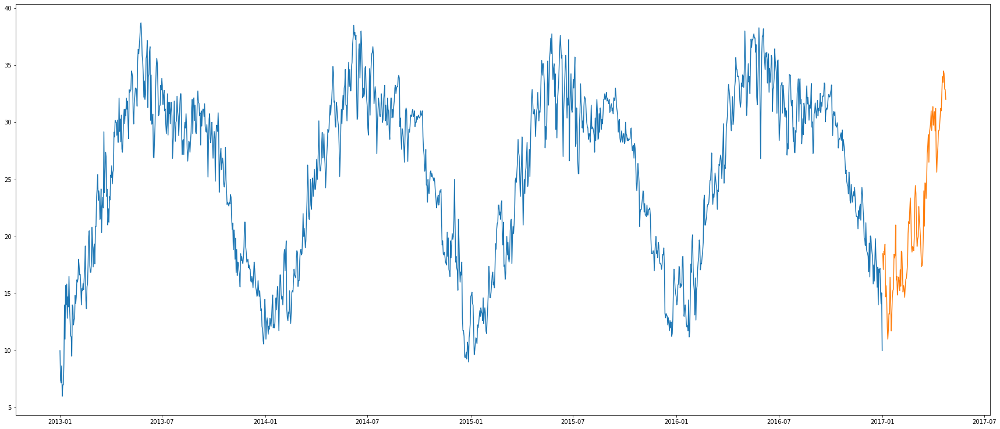

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

from pylab import rcParams
rcParams['figure.figsize']=30,13



plt.plot(train['meantemp'])
plt.plot(test['meantemp'])

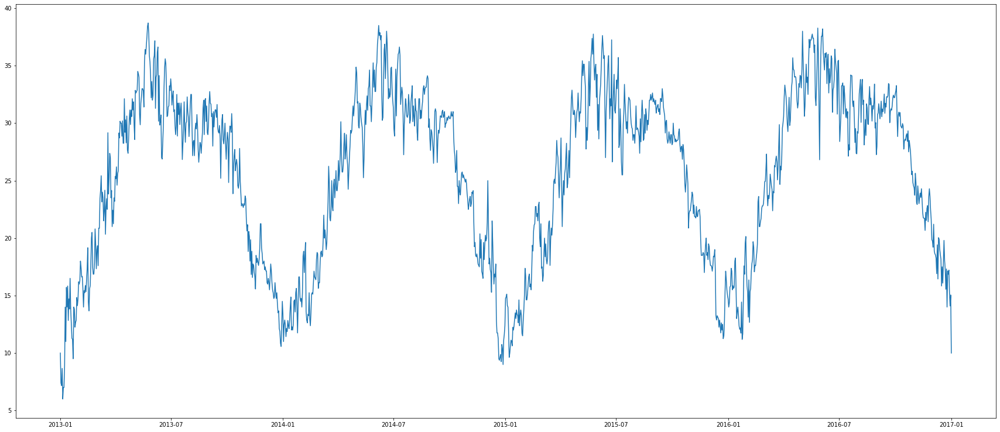

In [ ]:
plt.plot(train['meantemp'])

# Arima Model.

In [ ]:
data=train.copy(deep=True)

In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    #Determing rolling statistics
    MA = timeseries.rolling(window=12).mean()
    MSTD = timeseries.rolling(window=12).std()

    #Plot rolling statistics:
    plt.figure(figsize=(15,5))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(MA, color='red', label='Rolling Mean')
    std = plt.plot(MSTD, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    # Check for stationarity
    if dftest[1] < 0.05:
        print("Data is stationary")
    else:
        print("Data is not stationary")

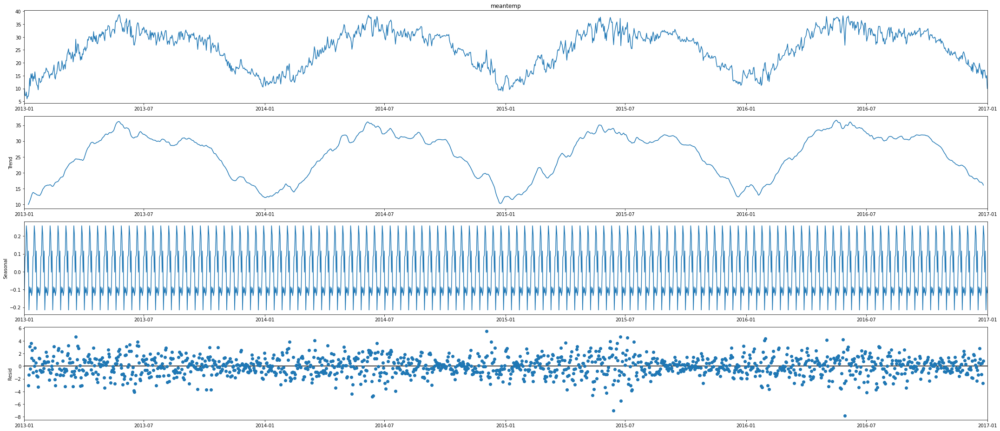

In [ ]:
import statsmodels.tsa.api as smt


dec = smt.seasonal_decompose(data['meantemp'],period = 12,model = 'additive').plot()
plt.show()

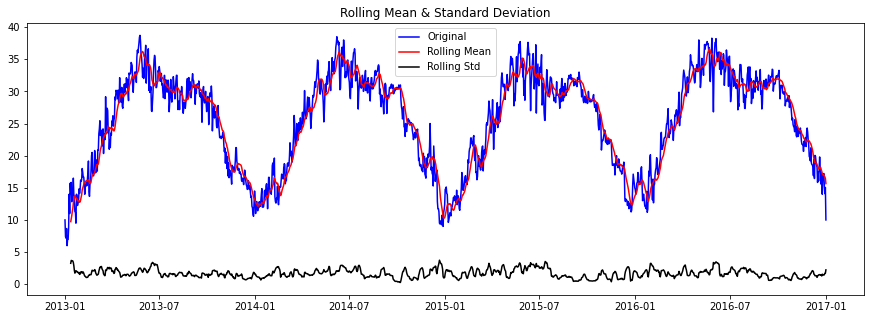

Results of Dickey-Fuller Test:
Test Statistic                  -2.02
p-value                          0.28
#Lags Used                      10.00
Number of Observations Used   1451.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Data is not stationary


In [ ]:
test_stationarity(data['meantemp'])

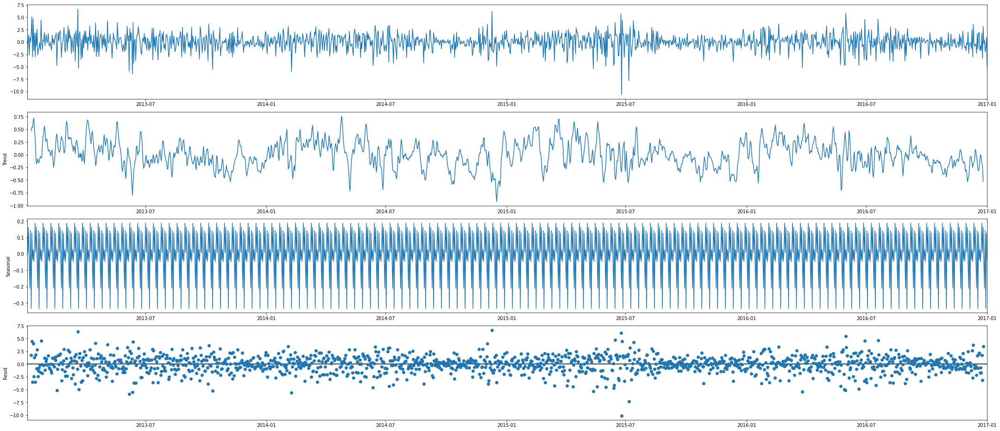

In [ ]:
data_diff = data.diff()
data_diff = data_diff.dropna()

dec = smt.seasonal_decompose(data_diff,period = 12).plot()
plt.show()

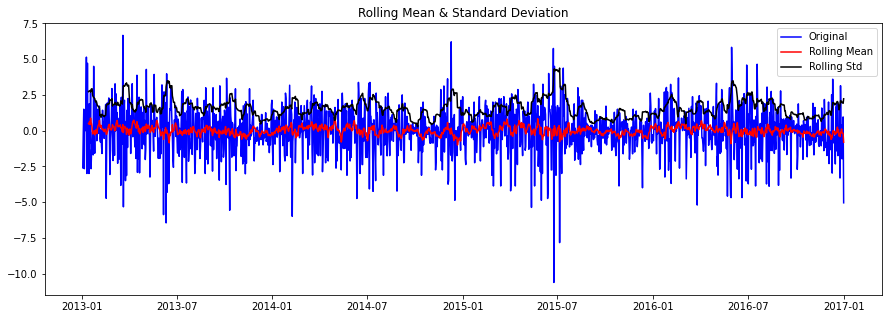

Results of Dickey-Fuller Test:
Test Statistic                 -16.38
p-value                          0.00
#Lags Used                       9.00
Number of Observations Used   1451.00
Critical Value (1%)             -3.43
Critical Value (5%)             -2.86
Critical Value (10%)            -2.57
dtype: float64
Data is stationary


In [ ]:
test_stationarity(data_diff)

In [ ]:
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.api as sm

def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        # acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 0))
        acf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        # smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        plt.tight_layout()

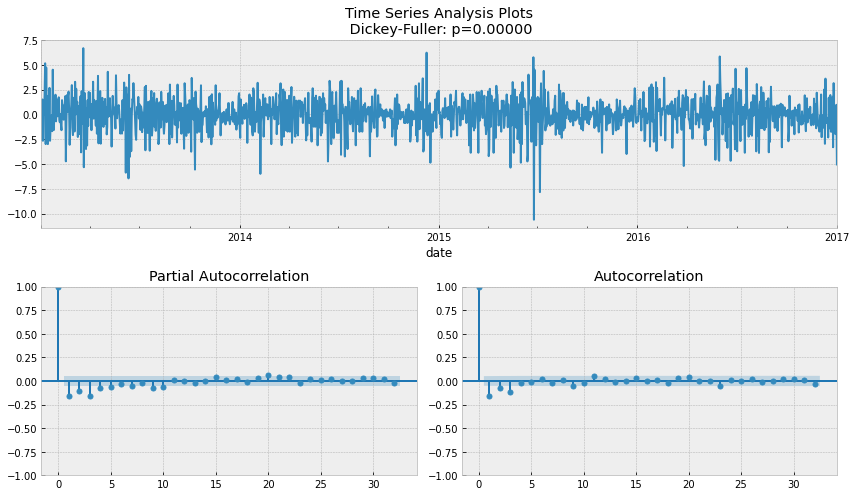

In [ ]:
tsplot(data_diff['meantemp'])

In [ ]:
from statsmodels.tsa.arima.model import ARIMA as ARIMA
arima_model = ARIMA(data_diff,order = (3,0,3))
arima_model_fit = arima_model.fit()

In [ ]:
arima_diff_prediction=arima_model_fit.predict(start=len(data_diff), end=len(data_diff)+112)

In [ ]:
arima_diff_prediction.head()

2017-01-02   1.34
2017-01-03   0.70
2017-01-04   0.76
2017-01-05   0.13
2017-01-06   0.18
Freq: D, Name: predicted_mean, dtype: float64

In [ ]:
arima_prediction=np.cumsum(arima_diff_prediction) + data.iloc[-1,0]

In [ ]:
data.tail()

,meantemp
date,
2016-12-28,17.22
2016-12-29,15.24
2016-12-30,14.10
2016-12-31,15.05
2017-01-01,10.00


In [ ]:
arima_prediction.head()

2017-01-02   11.34
2017-01-03   12.04
2017-01-04   12.80
2017-01-05   12.93
2017-01-06   13.11
Freq: D, Name: predicted_mean, dtype: float64

In [ ]:
arima_prediction.tail()

2017-04-20   13.36
2017-04-21   13.36
2017-04-22   13.37
2017-04-23   13.37
2017-04-24   13.37
Freq: D, Name: predicted_mean, dtype: float64

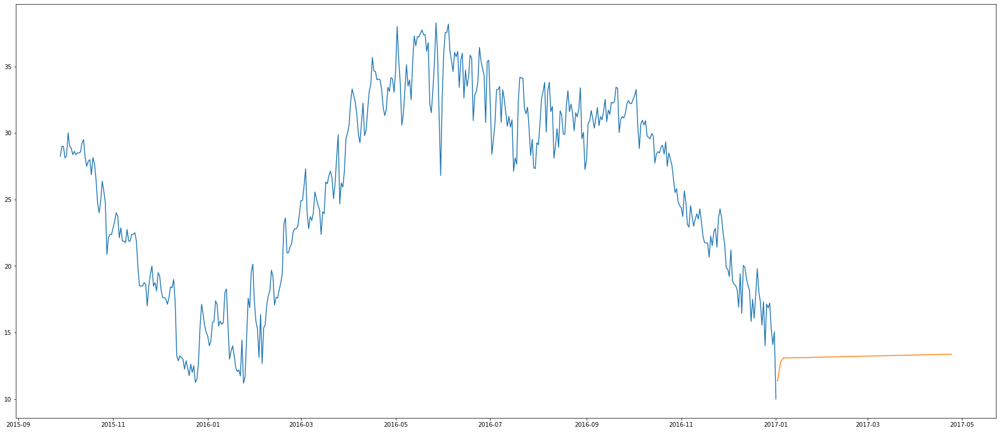

In [ ]:
plt.plot(data[1000:])
plt.plot(arima_prediction)

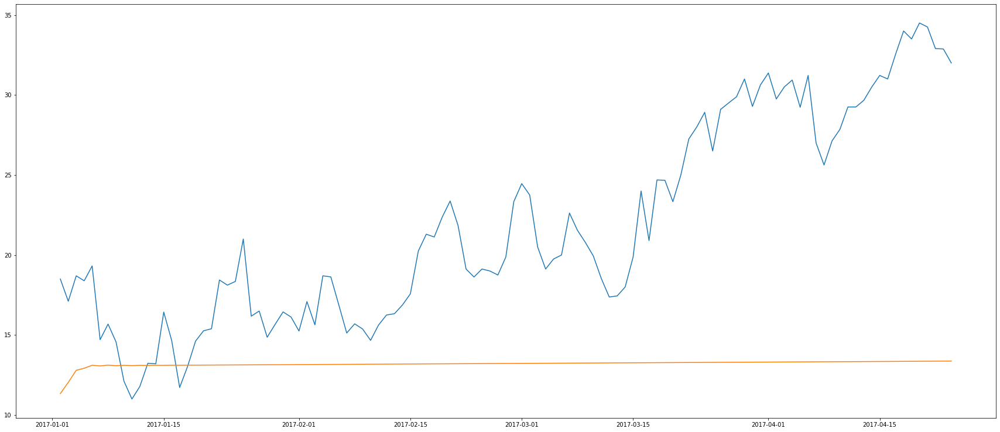

In [ ]:
plt.plot(test)
plt.plot(arima_prediction)

In [ ]:
test.shape

(113, 1)

In [ ]:
arima_prediction.shape

(113,)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_1 = mean_absolute_percentage_error(test,arima_prediction)
# mse = mean_squared_error(test, arima_prediction)
print(f"mean absolute percentage error is: {mape_1:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


# Sarima Model.

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
sarima_model = SARIMAX(data_diff, order=(3, 0, 3), seasonal_order=(3, 0, 3, 12))
sarima_model_fit = sarima_model.fit()

In [ ]:
sarima_diff_prediction=sarima_model_fit.predict(start=len(data_diff), end=len(data_diff)+112)

In [ ]:
sarima_prediction=np.cumsum(sarima_diff_prediction) + data.iloc[-1,0]

In [ ]:
data.tail()

,meantemp
date,
2016-12-28,17.22
2016-12-29,15.24
2016-12-30,14.10
2016-12-31,15.05
2017-01-01,10.00


In [ ]:
sarima_prediction.head()

2017-01-02   11.21
2017-01-03   11.94
2017-01-04   12.48
2017-01-05   12.75
2017-01-06   12.74
Freq: D, Name: predicted_mean, dtype: float64

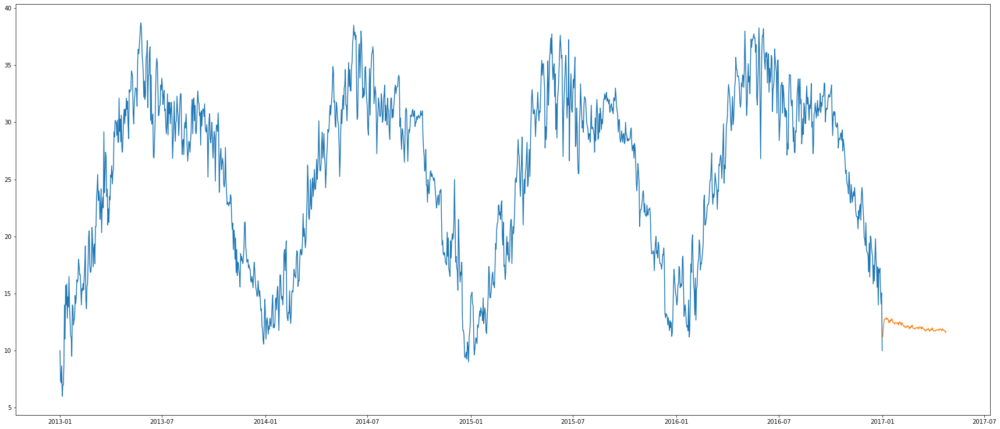

In [ ]:
plt.plot(data)
plt.plot(sarima_prediction)

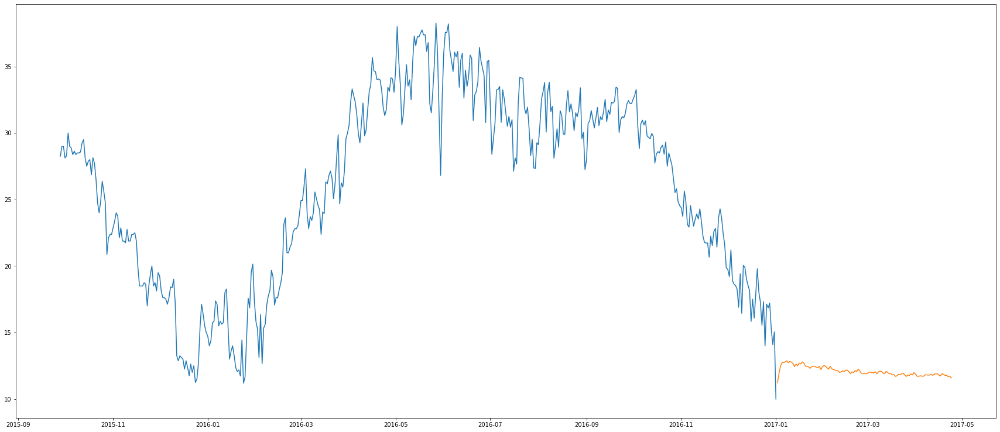

In [ ]:
plt.plot(data[1000:])
plt.plot(sarima_prediction)

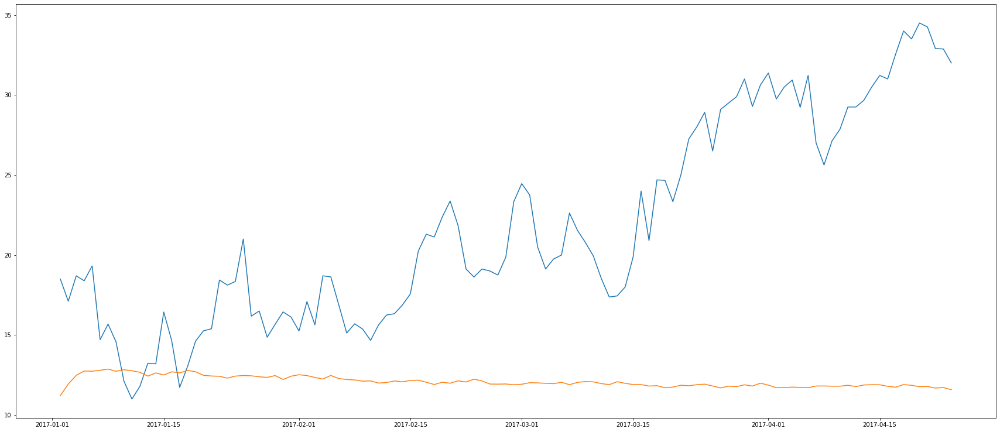

In [ ]:
plt.plot(test)
plt.plot(sarima_prediction)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_2 = mean_absolute_percentage_error(test,sarima_prediction)
# mse = mean_squared_error(test, sarima_prediction)
print(f"mean absolute percentage error is: {mape_2:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.40


# Auto arima Model.

AutoArima model with seasonal false on statioary data

In [ ]:
!pip install pmdarima --quiet
import pmdarima as pm
first_auto_arima_model=pm.auto_arima(data_diff['meantemp'], seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=2.28 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5648.181, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.90 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.61 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=1.37 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5542.478, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5600.115, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5544.118, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]          

In [ ]:
first_auto_arima_model_fit=first_auto_arima_model.fit(data_diff['meantemp'])

In [ ]:
first_auto_arima_diff_pred_value= first_auto_arima_model_fit.predict(n_periods=113)

In [ ]:
first_auto_arima_pred_value=np.cumsum(first_auto_arima_diff_pred_value) + data.iloc[-1,0]

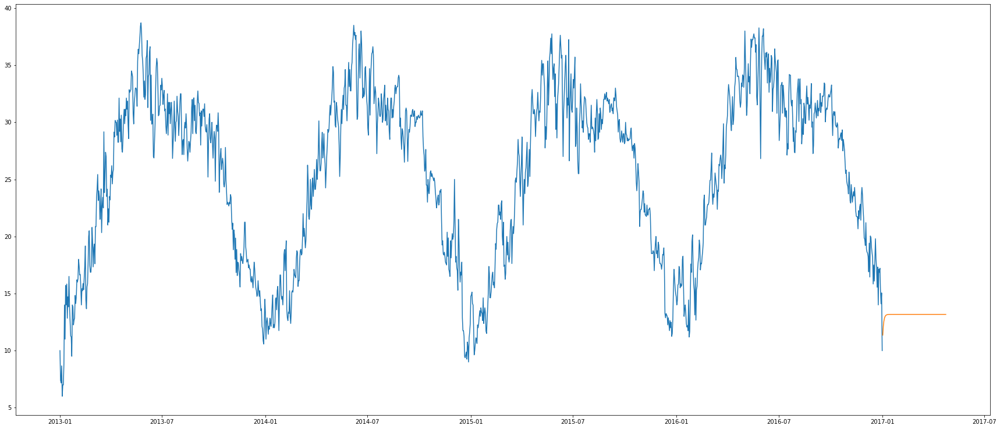

In [ ]:
plt.plot(data)
plt.plot(first_auto_arima_pred_value)

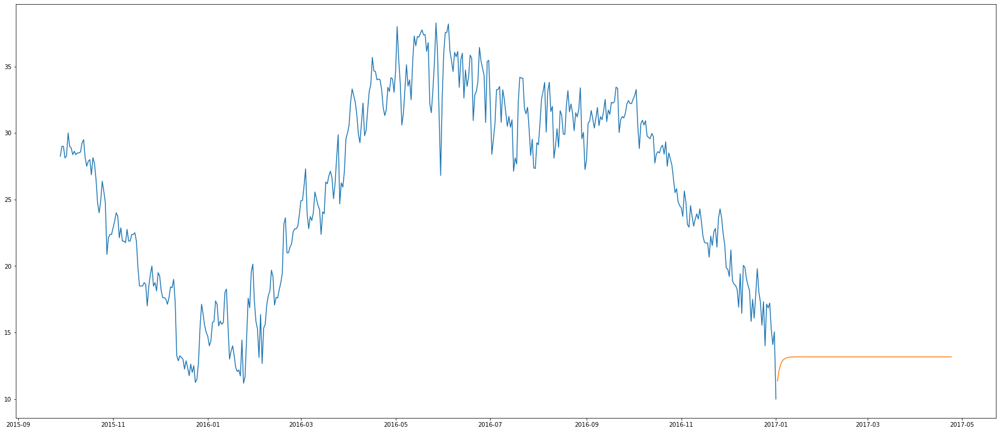

In [ ]:
plt.plot(data[1000:])
plt.plot(first_auto_arima_pred_value)

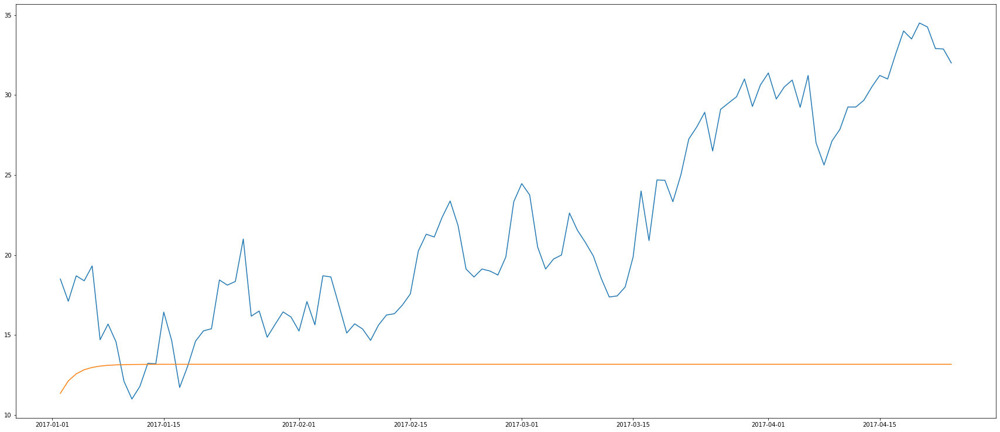

In [ ]:
plt.plot(test)
plt.plot(first_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_3 = mean_absolute_percentage_error(test,first_auto_arima_pred_value)
# mse = mean_squared_error(test, first_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_3:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal True on statioary data

In [ ]:
second_auto_arima_model=pm.auto_arima(data_diff['meantemp'], seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5648.181, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.41 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.71 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5542.478, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5600.115, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5544.118, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[0]          

In [ ]:
second_auto_arima_model_fit=second_auto_arima_model.fit(data_diff['meantemp'])

In [ ]:
second_auto_arima_diff_pred_value= second_auto_arima_model_fit.predict(n_periods=113)

In [ ]:
second_auto_arima_pred_value=np.cumsum(second_auto_arima_diff_pred_value) + data.iloc[-1,0]

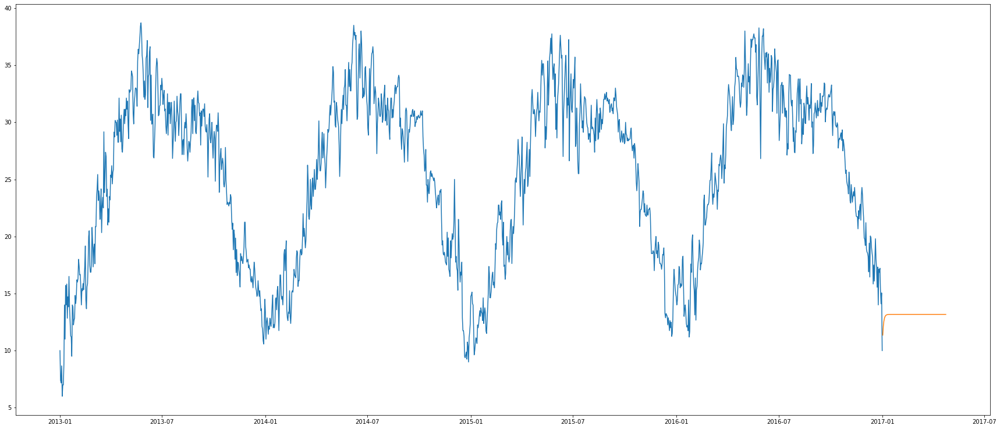

In [ ]:
plt.plot(data)
plt.plot(second_auto_arima_pred_value)

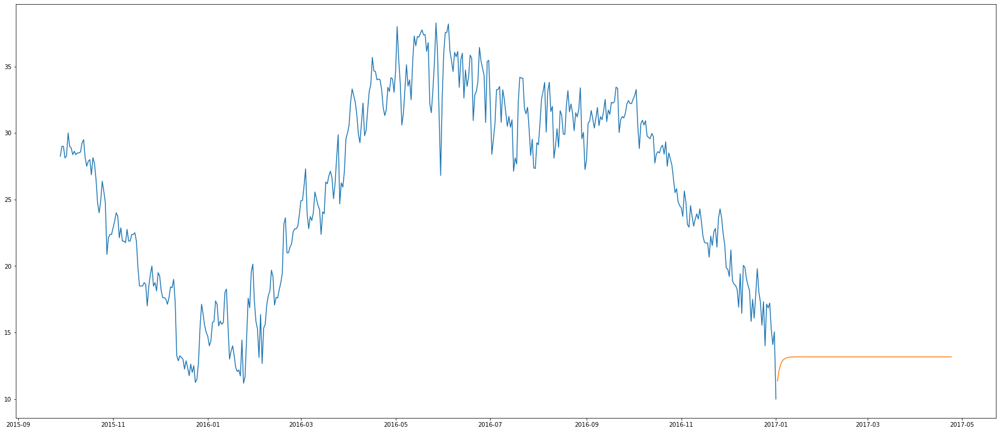

In [ ]:
plt.plot(data[1000:])
plt.plot(second_auto_arima_pred_value)

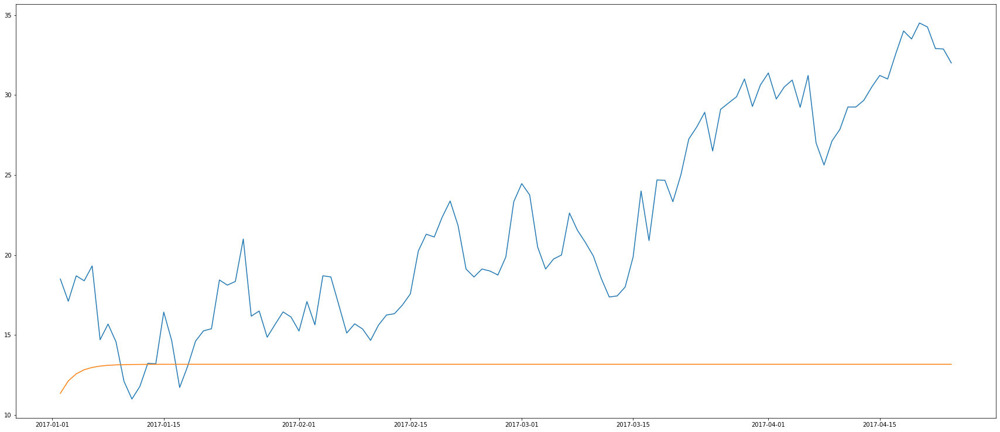

In [ ]:
plt.plot(test)
plt.plot(second_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_4 = mean_absolute_percentage_error(test,second_auto_arima_pred_value)
# mse = mean_squared_error(test, second_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_4:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal false on non-statioary data

In [ ]:
third_auto_arima_model=pm.auto_arima(data['meantemp'], seasonal=False, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=False)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5648.181, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.76 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5542.478, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5600.115, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5612.068, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=5544.118, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
third_auto_arima_model_fit=third_auto_arima_model.fit(data['meantemp'])

In [ ]:
third_auto_arima_pred_value=third_auto_arima_model_fit.predict(n_periods=113)

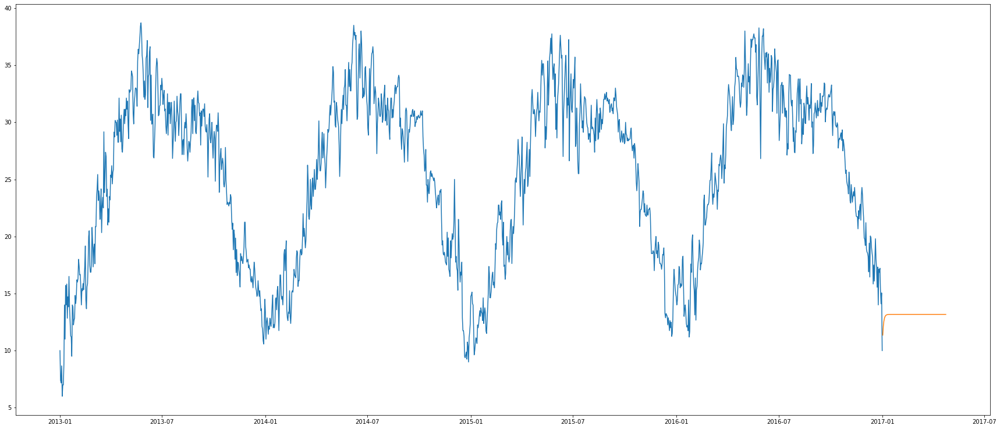

In [ ]:
plt.plot(data)
plt.plot(third_auto_arima_pred_value)

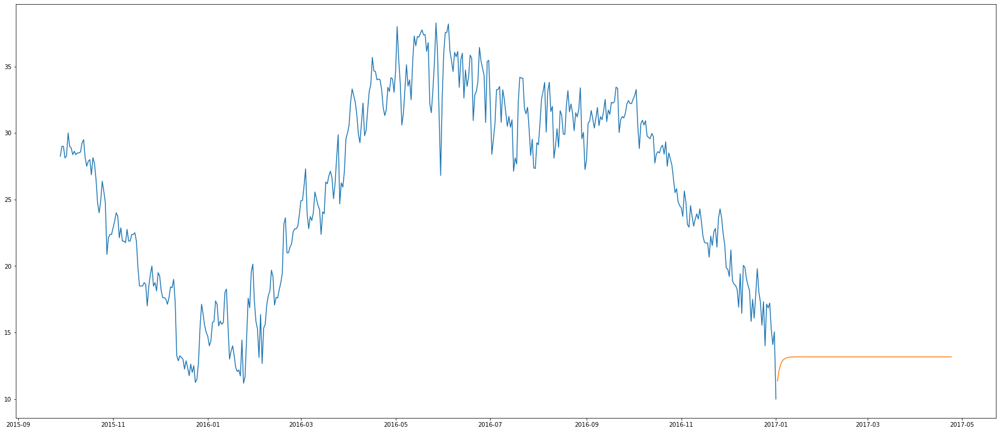

In [ ]:
plt.plot(data[1000:])
plt.plot(third_auto_arima_pred_value)

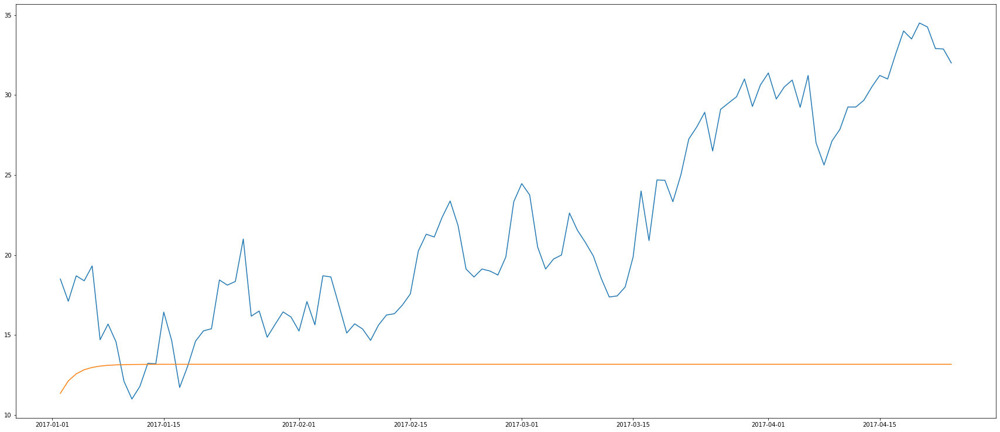

In [ ]:
plt.plot(test)
plt.plot(third_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_5 = mean_absolute_percentage_error(test,third_auto_arima_pred_value)
# mse = mean_squared_error(test, third_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_5:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


AutoArima model with seasonal True on non-statioary data

In [ ]:
fourth_auto_arima_model=pm.auto_arima(data['meantemp'], seasonal=True, suppress_warnings=True, stepwise=True, error_action="ignore", trace=True, stationary=False)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5546.314, Time=2.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5650.181, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5614.068, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5602.114, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5648.181, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5546.168, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5573.723, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5544.460, Time=0.77 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5546.100, Time=0.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5600.849, Time=0.29 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5542.478, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5600.115, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=5612.068, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=5544.118, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
fourth_auto_arima_model_fit=fourth_auto_arima_model.fit(data['meantemp'])

In [ ]:
fourth_auto_arima_pred_value=fourth_auto_arima_model_fit.predict(n_periods=113)

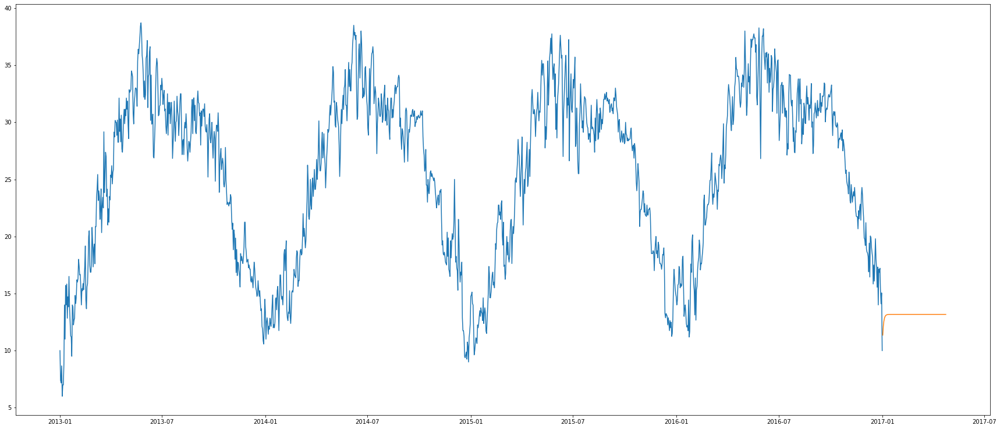

In [ ]:
plt.plot(data)
plt.plot(fourth_auto_arima_pred_value)

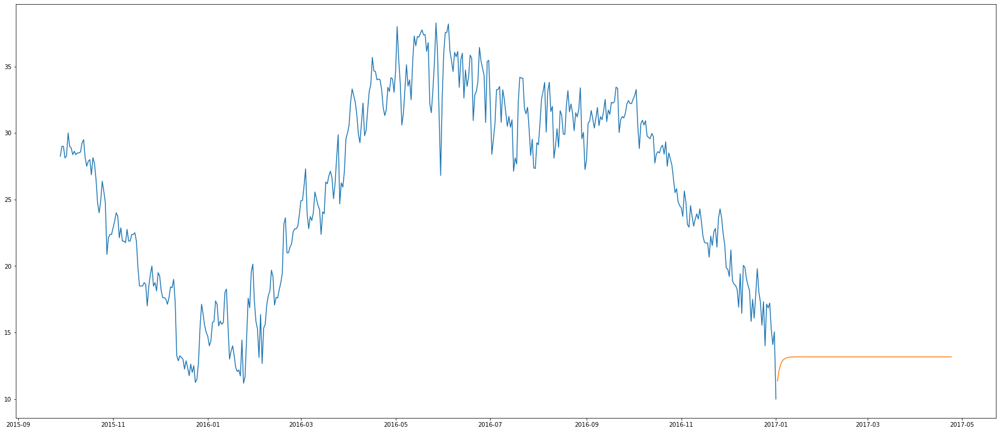

In [ ]:
plt.plot(data[1000:])
plt.plot(fourth_auto_arima_pred_value)

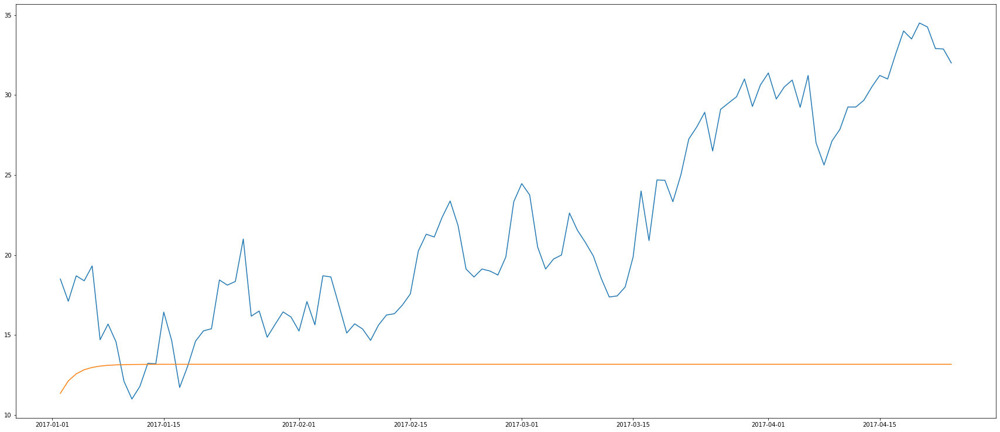

In [ ]:
plt.plot(test)
plt.plot(fourth_auto_arima_pred_value)

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
mape_6 = mean_absolute_percentage_error(test,fourth_auto_arima_pred_value)
# mse = mean_squared_error(test, fourth_auto_arima_pred_value)
print(f"mean absolute percentage error is: {mape_6:.2f}")
# print(f"mean squred error is: {mse:.2f}")

mean absolute percentage error is: 0.35


# Choosing the best model.

In [ ]:
# compare the MAPE scores and select the best model
best_model = np.argmin([mape_1,mape_2,mape_3,mape_4,mape_5,mape_6]) + 1
print(f"The best model is Model {best_model}")

The best model is Model 1
